In [1]:
import logging

import numpy as np
import optimistix as optx
from atmodeller import (
    InteriorAtmosphere,
    Planet,
    Species,
    SpeciesCollection,
    debug_logger,
    earth_oceans_to_hydrogen_mass,
    SolverParameters,
)
from atmodeller.eos import get_eos_models
from atmodeller.solubility import get_solubility_models
from atmodeller.thermodata import IronWustiteBuffer

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import LogNorm

from scipy.interpolate import interp1d
import os

from matplotlib.ticker import ScalarFormatter

formatter = ScalarFormatter(useMathText=False)
formatter.set_scientific(False)
formatter.set_useOffset(False)
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

logger = debug_logger()
logger.setLevel(logging.INFO)

# For more output use DEBUG
# logger.setLevel(logging.DEBUG)

Atmodeller initialized with double precision (float64)


In [2]:
number_of_realisations = 10
surface_temperature = 2000  # K -> take another temperature, the one aligning with mbe, up to 2-3k kelvin https://link.springer.com/article/10.1007/s11214-020-00660-3
# For simulations with fixed mass and surface radius:
planet_mass = 8e25 #13.4 earth masses for inside boundary (90% somewhat, could be less, reask)
surface_radius = 2.5559e7  # Lindal et al -> Can be discussed, radius of magma envelope boundary -> reduce and deal with incostitent between rocky and ice planets
#will iterate over later, take for now 0.8 r_U (I find results of 0.4-0.9). r_U = 2.5559e7 https://link.springer.com/article/10.1007/s11214-020-00660-3
mantle_melt_fraction = 1.0  # 0.1 -> we will iterate 

RANDOM_SEED = 0
np.random.seed(RANDOM_SEED)

#mass constraints given -> https://www.aanda.org/articles/aa/pdf/2021/06/aa40663-21.pdf

In [3]:
H_masspercent_lodders09: float = 73.9
He_masspercent_lodders09: float = 24.69
C_masspercent_lodders09: float = 0.22
N_masspercent_lodders09: float = 0.07
O_masspercent_lodders09: float = 0.63
Si_masspercent_lodders09: float = 0.07
Mg_masspercent_lodders09: float = 0.06

H_logN: float = 12
He_logN: float = 10.93
C_logN: float = 8.39
N_logN: float = 7.86
O_logN: float = 8.73
Si_logN: float = 7.53
Mg_logN: float = 7.54 

In [4]:
#SiO2 for primitive composition of Earth
SiO2_mantlemasspercent_palme14: float = 45.4
total_mantlemasspercent_palme14: float = 98.41
core_mass_fraction: float = 0.327  # typical values used are between 0.325 - 0.33
Si_massfraction_palme14: float = round(
    SiO2_mantlemasspercent_palme14
    / total_mantlemasspercent_palme14
    * (1 - core_mass_fraction)
    / (28.0855 + 2 * 15.999)
    * 28.0855,
    3,
)

O_massfraction_palme141: float = Si_massfraction_palme14 / 28.0855 * 2 * 15.999

MgO_mantlemasspercent_palme14: float = 36.77
Mg_massfraction_palme14: float = round(
    MgO_mantlemasspercent_palme14
    / total_mantlemasspercent_palme14
    * (1 - core_mass_fraction)
    / (24.305 + 15.999)
    * 24.305,
    3,
)

O_massfraction_palme142: float = Si_massfraction_palme14 / 24.305 * 15.999
O_massfraction_palme14 = O_massfraction_palme141 + O_massfraction_palme142

In [5]:
eos_models = get_eos_models()
sol_models = get_solubility_models()

H2O_g = Species.create_gas("H2O")
H2O_gs = Species.create_gas("H2O", solubility=sol_models["H2O_peridotite_sossi23"])
H2O_rgs = Species.create_gas(
    "H2O",
    activity=eos_models["H2O_cork_holland98"],
    solubility=sol_models["H2O_peridotite_sossi23"],
)

H2_g = Species.create_gas("H2")
H2_gs = Species.create_gas("H2", solubility=sol_models["H2_basalt_hirschmann12"])
H2_rgs = Species.create_gas(
    "H2", activity=eos_models["H2_chabrier21"], solubility=sol_models["H2_basalt_hirschmann12"]
)

O2_g = Species.create_gas("O2")
O2_rg = Species.create_gas("O2", activity=eos_models["O2_cs_shi92"])

OSi_g = Species.create_gas("OSi")
OSi_rg = Species.create_gas("OSi", activity=eos_models["OSi_rk49_connolly16"])

H4Si_g = Species.create_gas("H4Si")
H4Si_rg = Species.create_gas("H4Si", activity=eos_models["H4Si_wang18"])

O2Si_l = Species.create_condensed("O2Si", state="l")
O2Si_bqz = Species.create_condensed("O2Si", state="bqz")

CO2_g = Species.create_gas("CO2")
CO2_gs = Species.create_gas("CO2", solubility=sol_models["CO2_basalt_dixon95"])
CO2_rgs = Species.create_gas(
    "CO2", solubility=sol_models["CO2_basalt_dixon95"], activity=eos_models["CO2_cs_shi92"]
)

CO_g = Species.create_gas("CO")
CO_gs = Species.create_gas("CO", solubility=sol_models["CO_basalt_yoshioka19"])
CO_rgs = Species.create_gas(
    "CO", solubility=sol_models["CO_basalt_yoshioka19"], activity=eos_models["CO_cs_shi92"]
)

CH4_g = Species.create_gas("CH4")
CH4_gs = Species.create_gas("CH4", solubility=sol_models["CH4_basalt_ardia13"])
CH4_rgs = Species.create_gas(
    "CH4", solubility=sol_models["CH4_basalt_ardia13"], activity=eos_models["CH4_cs_shi92"]
)

N2_g = Species.create_gas("N2")
N2_gs = Species.create_gas("N2", solubility=sol_models["N2_basalt_libourel03"])
N2_rgs = Species.create_gas(
    "N2", solubility=sol_models["N2_basalt_libourel03"], activity=eos_models["N2_cs_saxena87"]
)

NH3_g = Species.create_gas("NH3")
NH3_rg = Species.create_gas("H3N", activity=eos_models["H3N_rk49_reid87"])

He_g = Species.create_gas("He")
He_gs = Species.create_gas("He", solubility=sol_models["He_basalt_jambon86"])
He_rgs = Species.create_gas(
    "He", solubility=sol_models["He_basalt_jambon86"], activity=eos_models["He_chabrier21"]
)

Mg_g = Species.create_gas("Mg")
#Mg_gs = Species.create_gas("He", solubility=sol_models["He_basalt_jambon86"])
#Mg_rgs = Species.create_gas(
#    "He", solubility=sol_models["He_basalt_jambon86"], activity=eos_models["He_chabrier21"]
#)

MgO_l = Species.create_condensed("MgO", state="l")
MgO_cr = Species.create_condensed("MgO", state="cr")
MgH_g = Species.create_gas("MgH")
MgOH_g = Species.create_gas("MgOH")

species_HHeCNOSi_magma_nosol_ideal = SpeciesCollection(
    (H2O_g, H2_g, O2_g, OSi_g, H4Si_g, O2Si_l, CO2_g, CO_g, CH4_g, N2_g, NH3_g, He_g, Mg_g, MgO_l, MgH_g, MgOH_g)
)
species_HHeCNOSi_magma_sol_ideal = SpeciesCollection(
    (H2O_gs, H2_gs, O2_g, OSi_g, H4Si_g, O2Si_l, CO2_gs, CO_gs, CH4_gs, N2_gs, NH3_g, He_gs, Mg_g, MgO_l, MgH_g, MgOH_g)
)
species_HHeCNOSi_magma_sol_real = SpeciesCollection(
    (
        H2O_rgs,
        H2_rgs,
        O2_rg,
        OSi_rg,
        H4Si_rg,
        O2Si_l,
        CO2_rgs,
        CO_rgs,
        CH4_rgs,
        N2_rgs,
        NH3_rg,
        He_rgs,
        Mg_g, 
        MgO_l,
        MgH_g,
        MgOH_g
    )
)
#MgH Magnesium Hydride
#MgOH Magnesium Hydroxide -> ideal gas law 
#Plot condensed moles for example for Silicon
#mass balance, take mass constraints, take atmospheric mass/moles+ take condensed mass/moles + take dissolved mass/moles
#plot envelope mass fraction, envelope mass/planet mass, Helled, what do they call the volatile layer. 
#temperature-pressure profile at 1 Myr or 10 Myr
#Ravit Helled 2011-2013


In [6]:
temperature = np.linspace(2000,3000,500)
hmps = np.logspace(-1, 1, num=number_of_realisations)  # wt% Hn can go higher for exploration, maybe even 50)

In [10]:
color_tot = "black"
color_H2 = "orange"
color_H2O = "blue"
color_SiH4 = "red"
color_SiO = "brown"
color_O2 = "limegreen"
color_CO2 = "cyan"
color_CO = "magenta"
color_CH4 = "purple"
color_N2 = "green"
color_NH3 = "pink"
color_MgO = "darkred"
color_He = "gray"
color_H = "orange"
color_C = "cyan"
color_N = "green"
color_O = "blue"
color_Si = "red"
color_Mg = "lime"
color_MgH2 = "gold"
color_MgH = "teal"
color_MgOH = "indigo"

[15:43:43 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:43:43 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.1


[15:43:44 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:43:44 - atmodeller.classes             - INFO     ] - Solver steps (max) = 28
[15:43:45 - atmodeller.output              - INFO     ] - Writing output to excel
[15:43:45 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:43:45 - atmodeller.output              - INFO     ] - Computing asdict output
[15:43:51 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:43:51 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

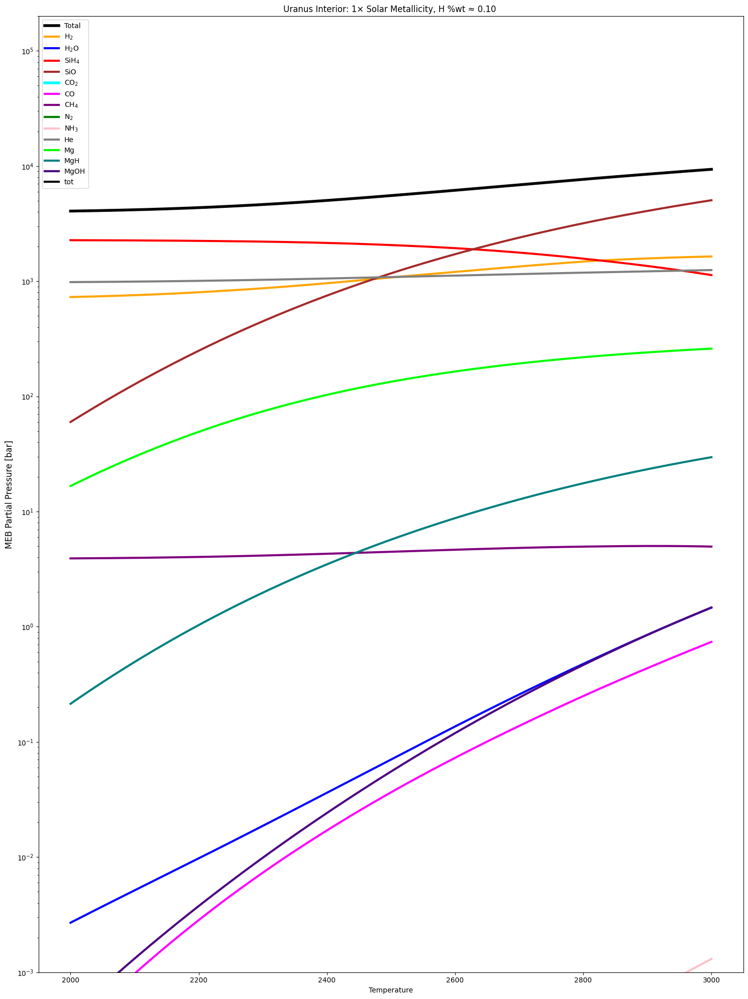

[15:44:29 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:44:29 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.16681005372000587


[15:44:32 - atmodeller.classes             - WARNING  ] - 37 model(s) failed to converge on the first attempt
[15:44:32 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:44:32 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:44:32 - atmodeller.classes             - WARNING  ] - Attempting to solve the 37 models(s) that initially failed
[15:44:32 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:44:36 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[15:44:37 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[15:44:37 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:44:37 - atmodeller.classes             - INFO     ] - Solver steps (max) =

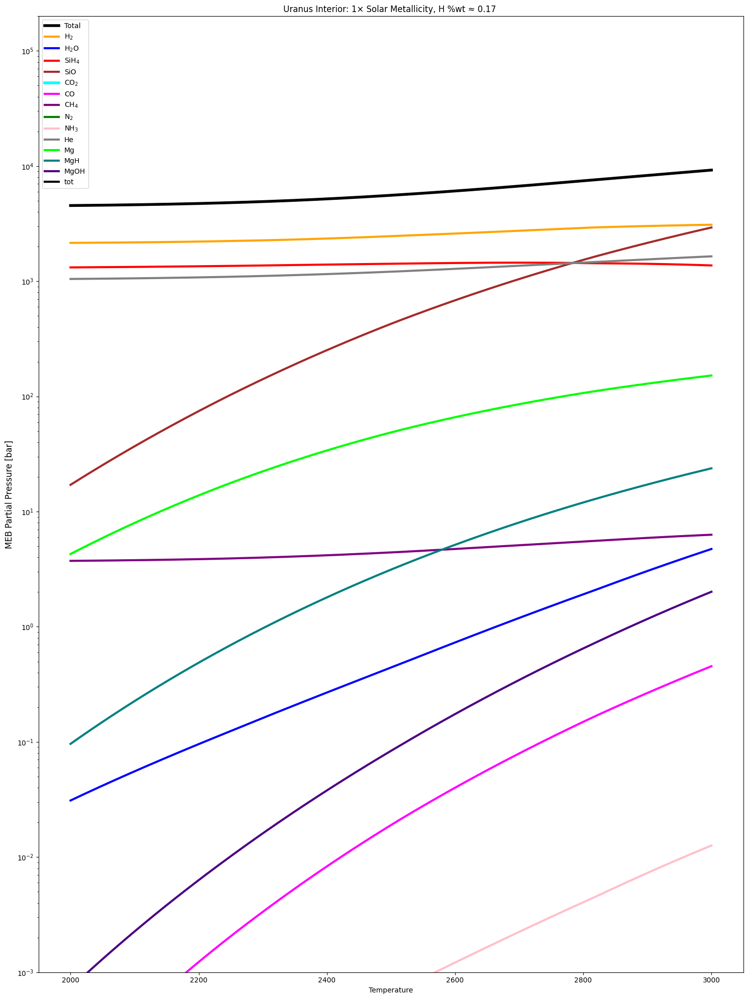

[15:45:17 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:45:17 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.2782559402207124


[15:45:19 - atmodeller.classes             - WARNING  ] - 6 model(s) failed to converge on the first attempt
[15:45:19 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:45:19 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:45:19 - atmodeller.classes             - WARNING  ] - Attempting to solve the 6 models(s) that initially failed
[15:45:19 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:45:23 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[15:45:23 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[15:45:23 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:45:23 - atmodeller.classes             - INFO     ] - Solver steps (max) = 2

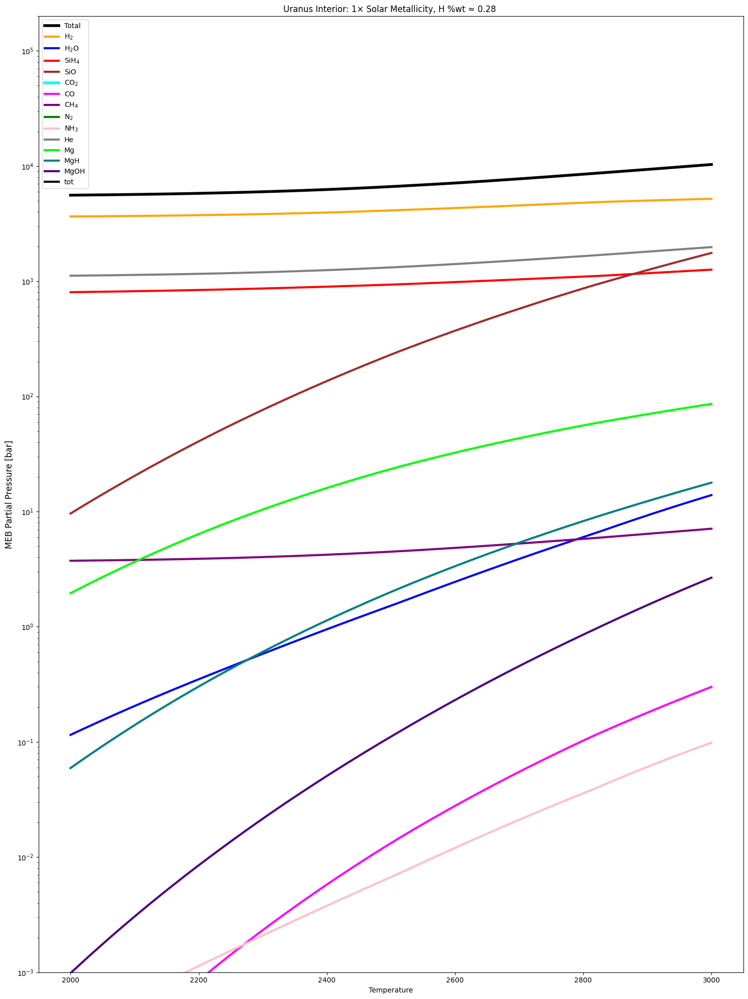

[15:46:08 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:46:08 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.46415888336127786


[15:46:09 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:46:09 - atmodeller.classes             - INFO     ] - Solver steps (max) = 52
[15:46:10 - atmodeller.output              - INFO     ] - Writing output to excel
[15:46:10 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:46:10 - atmodeller.output              - INFO     ] - Computing asdict output
[15:46:15 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:46:16 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

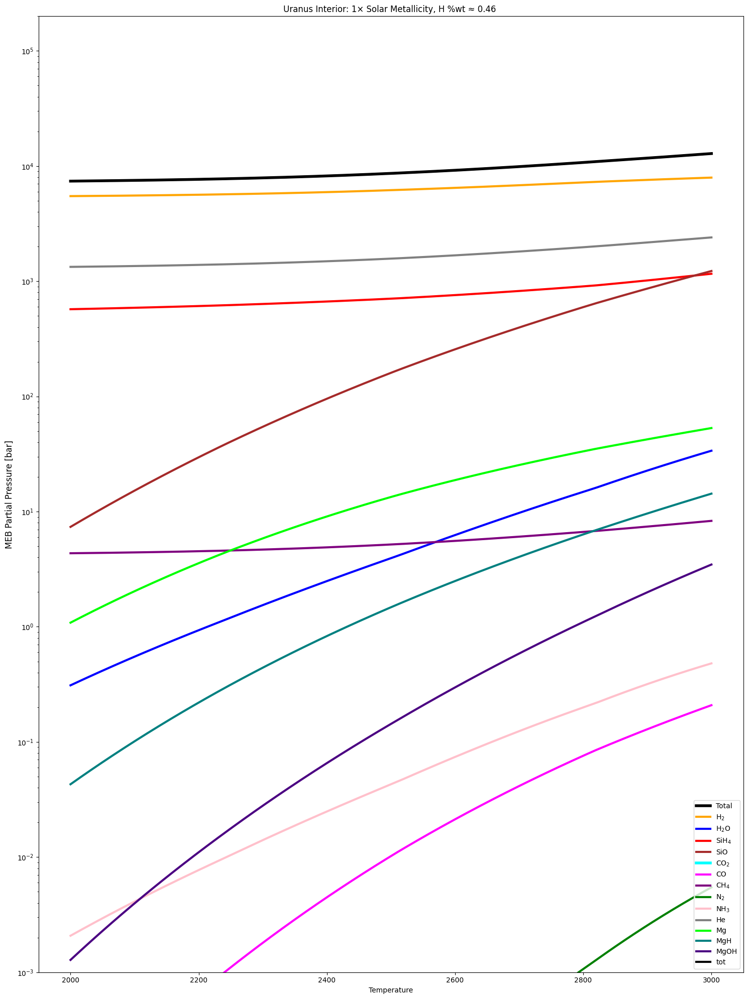

[15:46:51 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:46:51 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.774263682681127


[15:46:52 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:46:52 - atmodeller.classes             - INFO     ] - Solver steps (max) = 97
[15:46:54 - atmodeller.output              - INFO     ] - Writing output to excel
[15:46:54 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:46:54 - atmodeller.output              - INFO     ] - Computing asdict output
[15:46:59 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:46:59 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

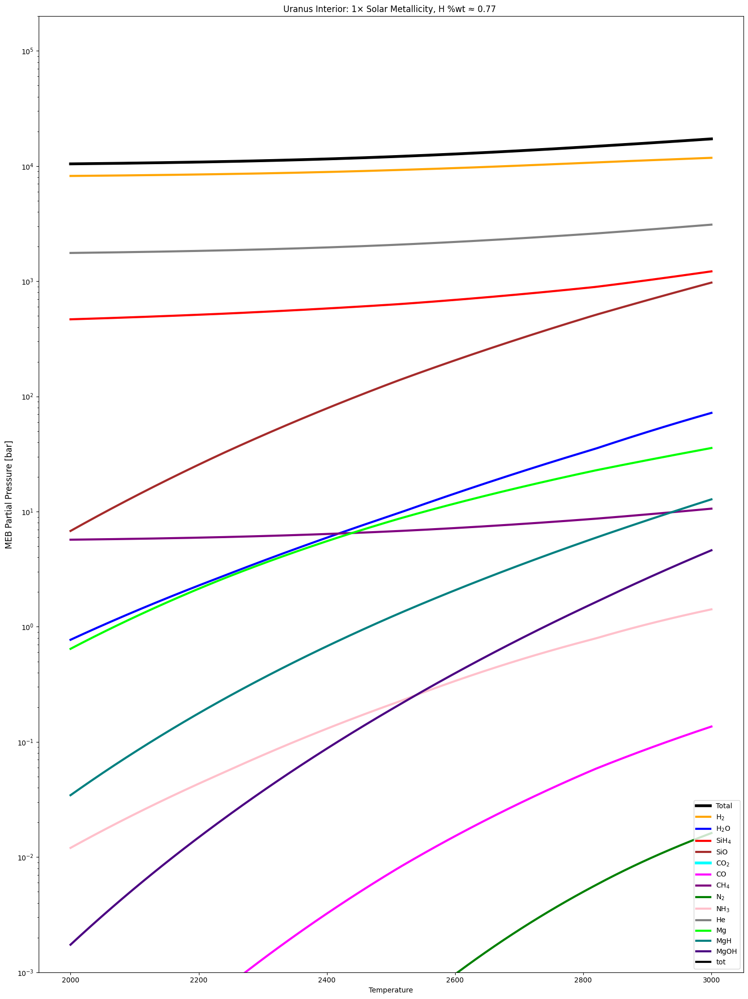

[15:47:37 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:47:37 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

1.291549665014884


[15:47:39 - atmodeller.classes             - WARNING  ] - 2 model(s) failed to converge on the first attempt
[15:47:39 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:47:39 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:47:39 - atmodeller.classes             - WARNING  ] - Attempting to solve the 2 models(s) that initially failed
[15:47:39 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:47:44 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[15:47:44 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[15:47:44 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:47:44 - atmodeller.classes             - INFO     ] - Solver steps (max) = 2

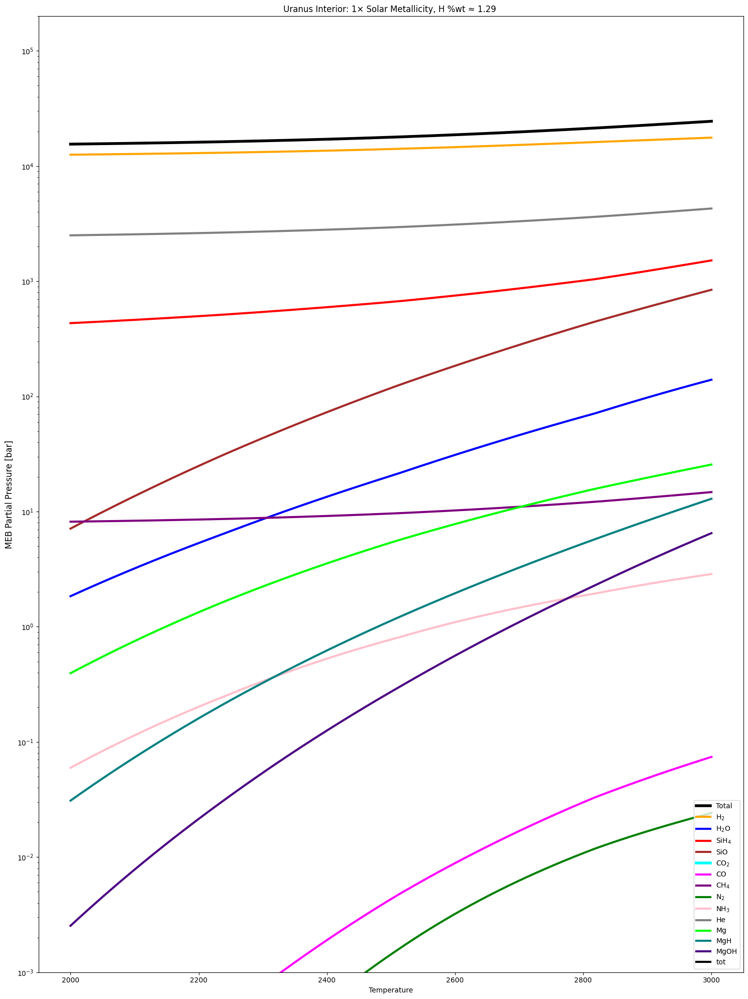

[15:48:30 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:48:30 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

2.1544346900318834


[15:48:33 - atmodeller.classes             - WARNING  ] - 3 model(s) failed to converge on the first attempt
[15:48:33 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:48:33 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:48:33 - atmodeller.classes             - WARNING  ] - Attempting to solve the 3 models(s) that initially failed
[15:48:33 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:48:44 - atmodeller.classes             - INFO     ] - Multistart complete with 3 total attempt(s)
[15:48:44 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 497 (99.40%)
[15:48:44 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 2, model count: 2 (0.40%)
[15:48:44 - atmodeller.classes             - INFO     ] - Multistart, max attem

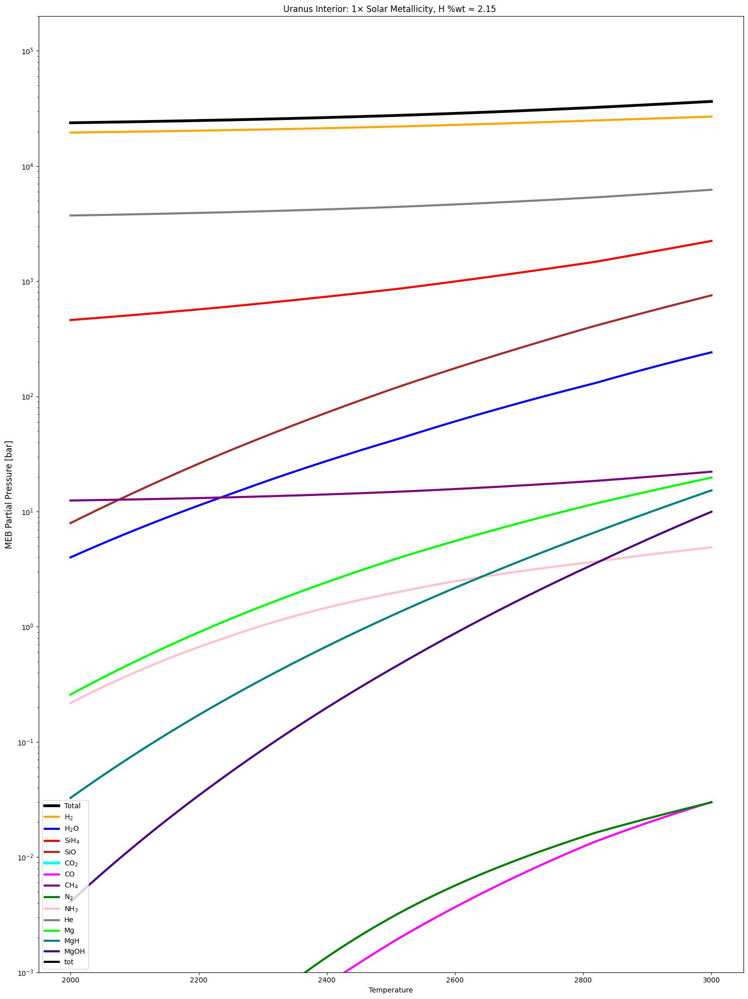

[15:49:34 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:49:34 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

3.593813663804626


[15:49:34 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:49:34 - atmodeller.classes             - INFO     ] - Solver steps (max) = 70
[15:49:36 - atmodeller.output              - INFO     ] - Writing output to excel
[15:49:36 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:49:36 - atmodeller.output              - INFO     ] - Computing asdict output
[15:49:42 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:49:42 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

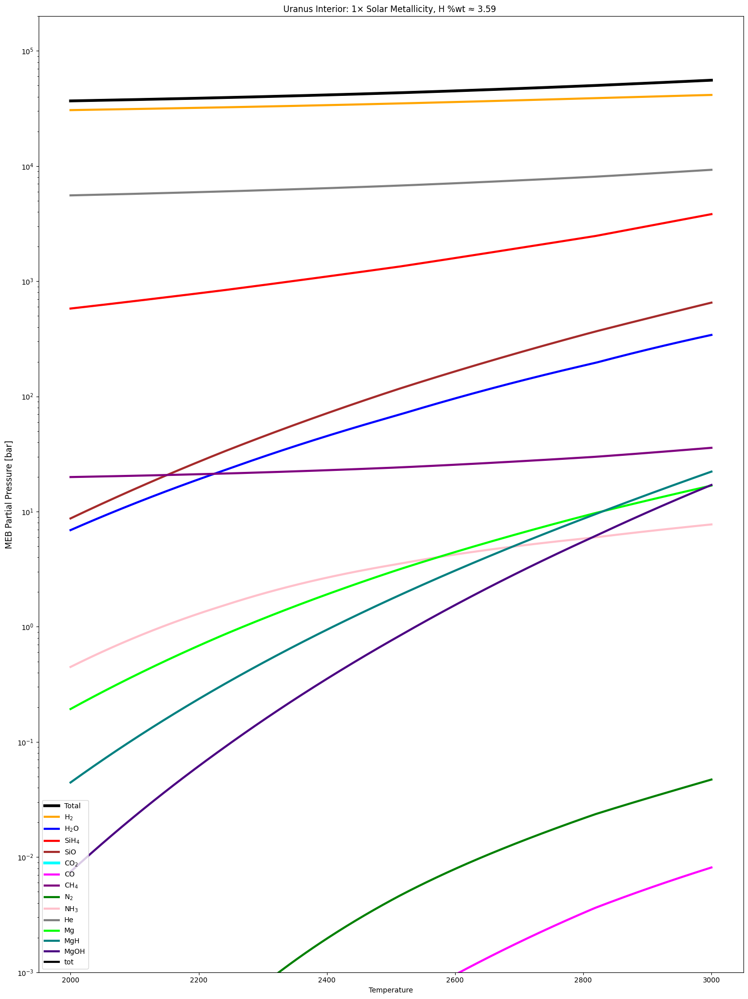

[15:50:22 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:50:22 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

5.994842503189409


[15:50:22 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:50:22 - atmodeller.classes             - INFO     ] - Solver steps (max) = 25
[15:50:23 - atmodeller.output              - INFO     ] - Writing output to excel
[15:50:23 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:50:23 - atmodeller.output              - INFO     ] - Computing asdict output
[15:50:30 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:50:30 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

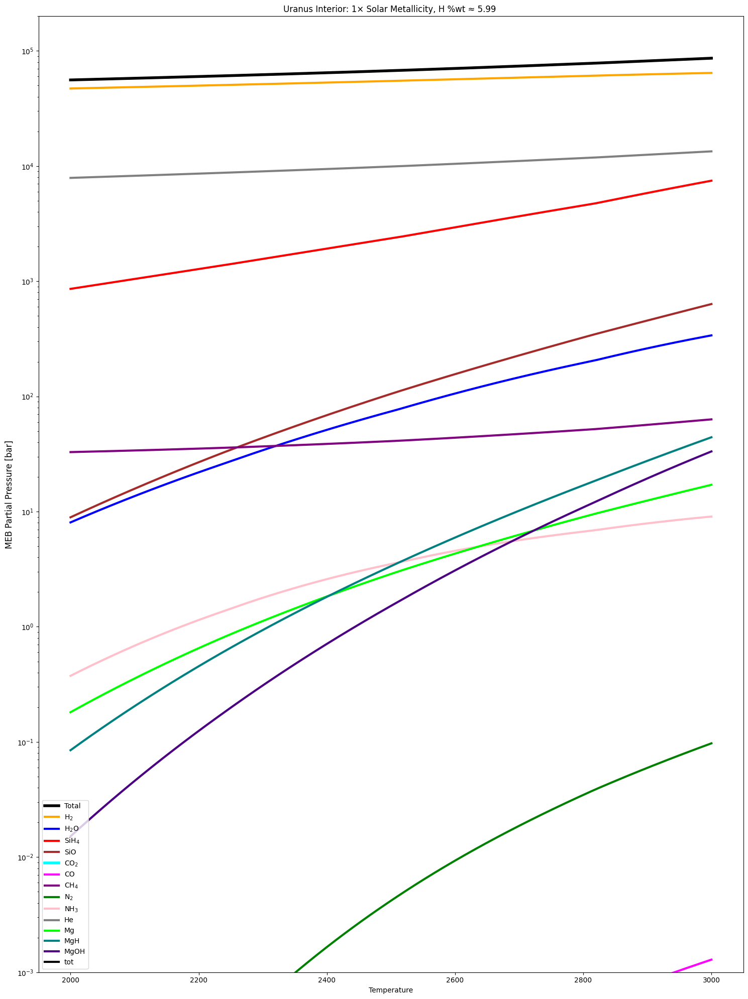

[15:51:09 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:51:09 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

10.0


[15:51:10 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:51:10 - atmodeller.classes             - INFO     ] - Solver steps (max) = 56
[15:51:11 - atmodeller.output              - INFO     ] - Writing output to excel
[15:51:11 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:51:11 - atmodeller.output              - INFO     ] - Computing asdict output
[15:51:17 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:51:17 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

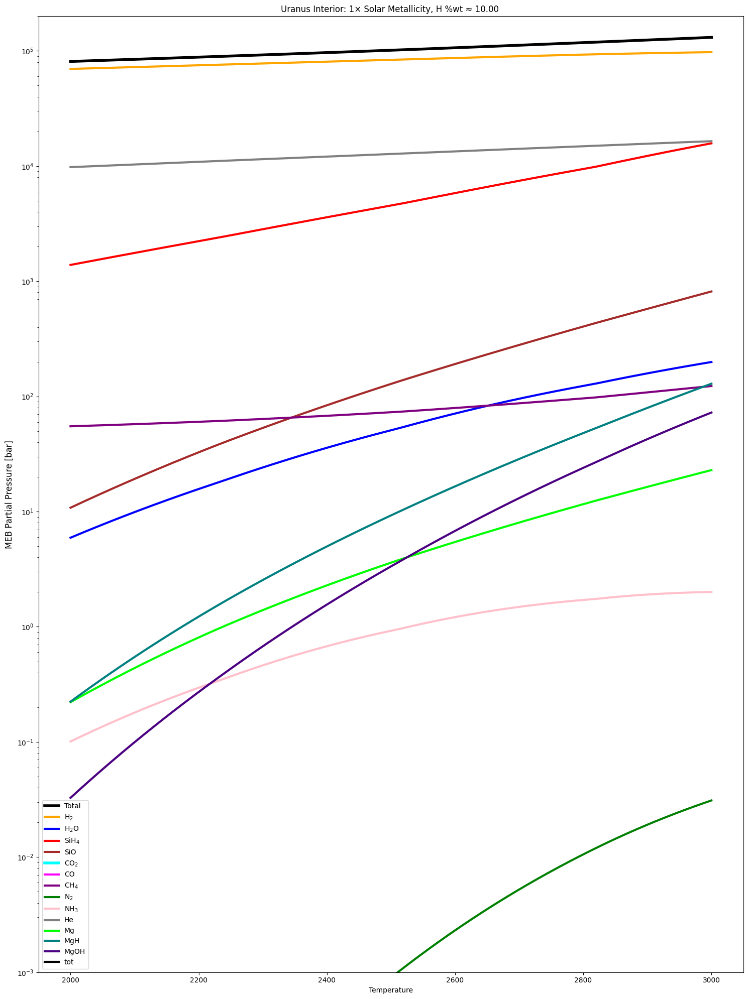

[15:51:55 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:51:55 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.1


[15:51:56 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:51:56 - atmodeller.classes             - INFO     ] - Solver steps (max) = 27
[15:51:57 - atmodeller.output              - INFO     ] - Writing output to excel
[15:51:57 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:51:57 - atmodeller.output              - INFO     ] - Computing asdict output
[15:52:04 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:52:04 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

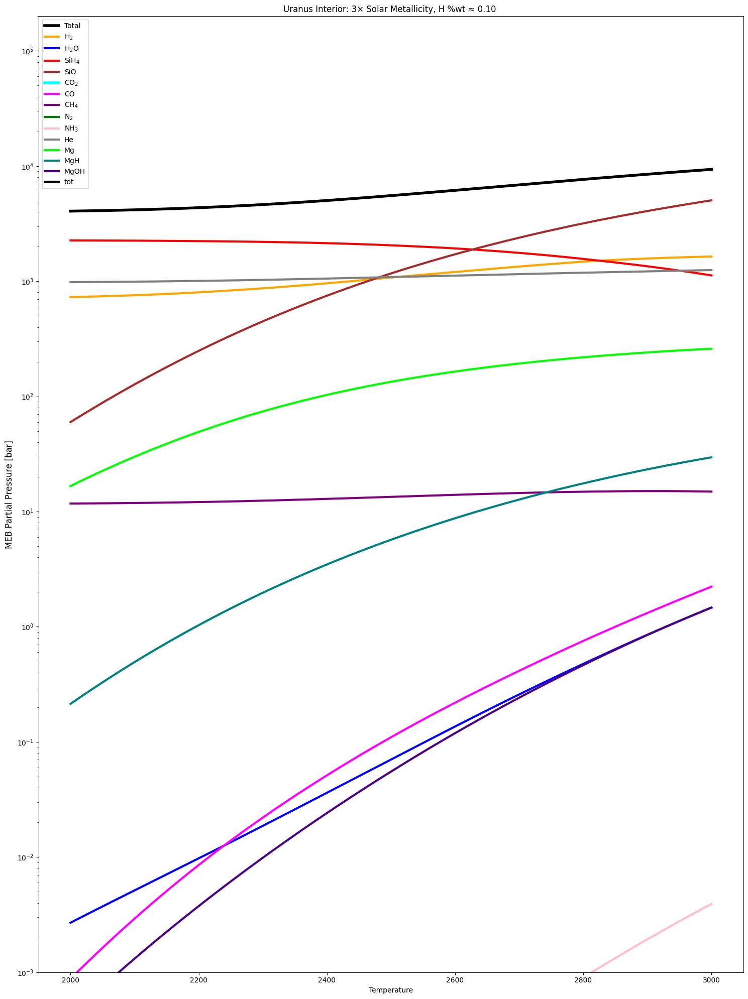

[15:52:40 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:52:40 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.16681005372000587


[15:52:42 - atmodeller.classes             - WARNING  ] - 24 model(s) failed to converge on the first attempt
[15:52:42 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:52:42 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:52:42 - atmodeller.classes             - WARNING  ] - Attempting to solve the 24 models(s) that initially failed
[15:52:42 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:52:47 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[15:52:47 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[15:52:47 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:52:47 - atmodeller.classes             - INFO     ] - Solver steps (max) =

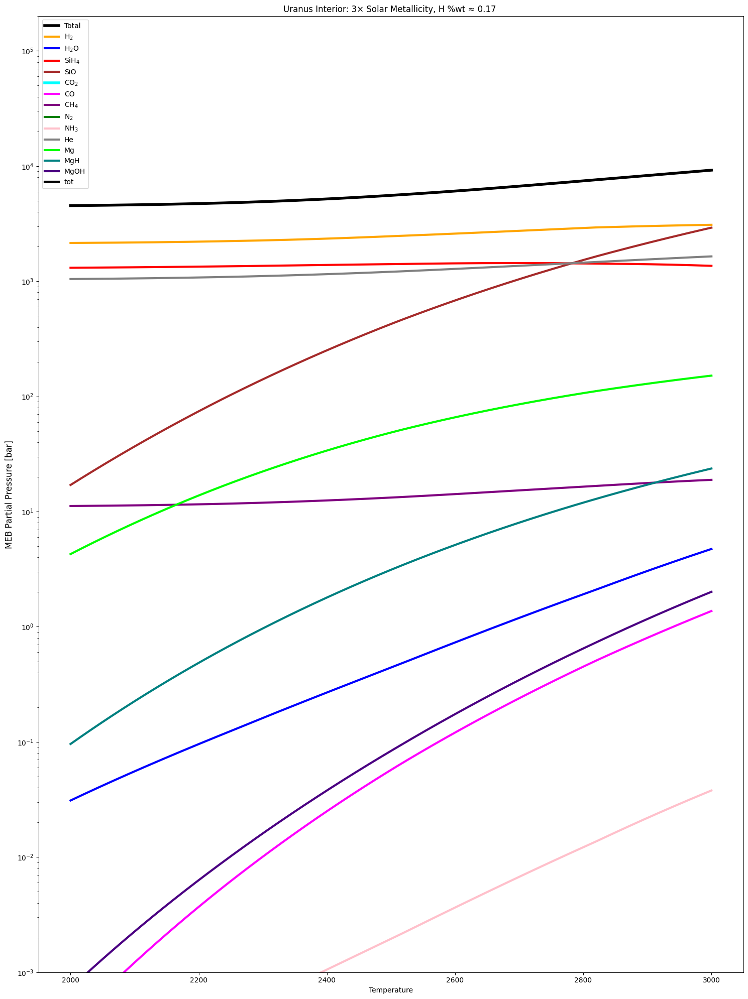

[15:53:29 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:53:29 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.2782559402207124


[15:53:31 - atmodeller.classes             - WARNING  ] - 4 model(s) failed to converge on the first attempt
[15:53:31 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[15:53:31 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[15:53:31 - atmodeller.classes             - WARNING  ] - Attempting to solve the 4 models(s) that initially failed
[15:53:31 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[15:53:36 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[15:53:36 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[15:53:36 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:53:36 - atmodeller.classes             - INFO     ] - Solver steps (max) = 1

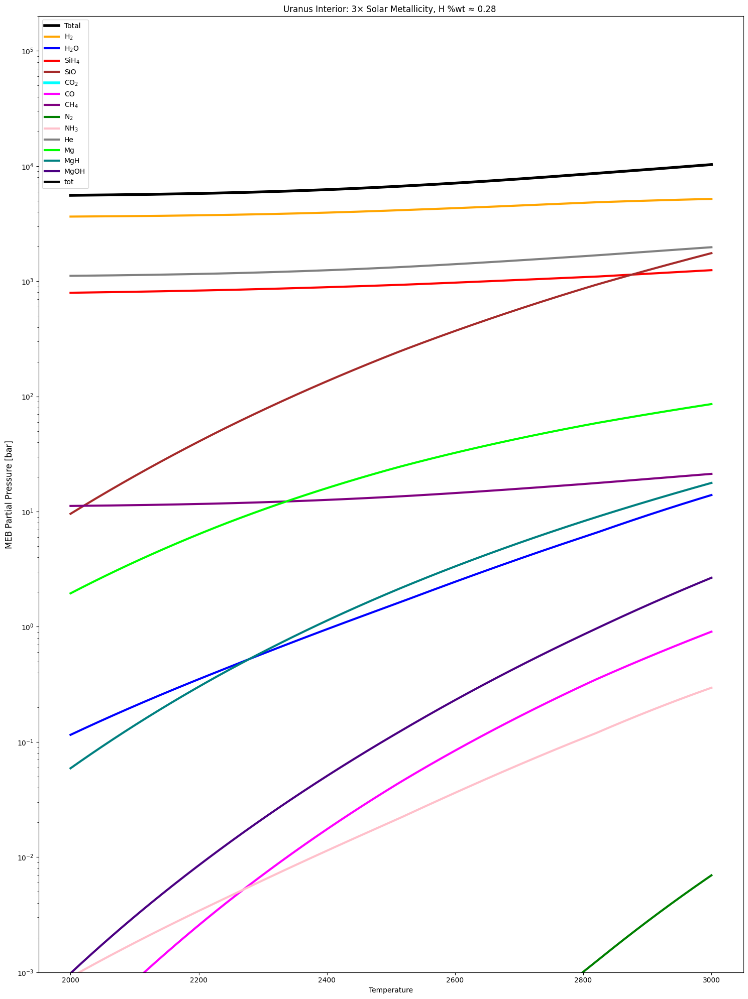

[15:54:19 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:54:19 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.46415888336127786


[15:54:19 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:54:19 - atmodeller.classes             - INFO     ] - Solver steps (max) = 47
[15:54:20 - atmodeller.output              - INFO     ] - Writing output to excel
[15:54:20 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:54:20 - atmodeller.output              - INFO     ] - Computing asdict output
[15:54:26 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:54:26 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

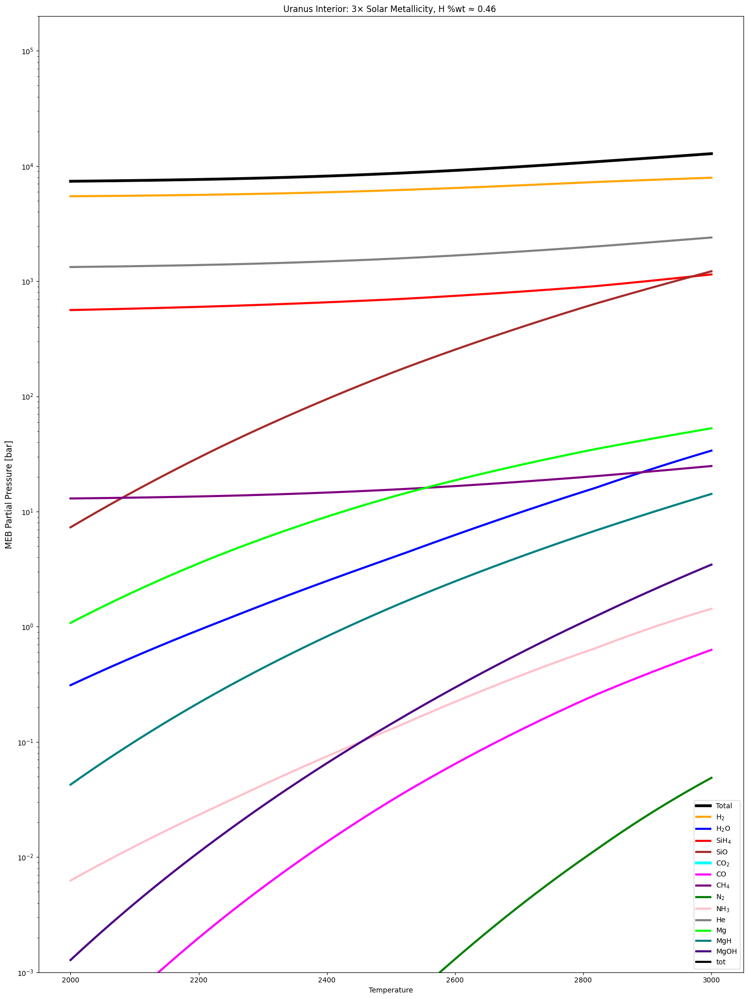

[15:55:00 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:55:00 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.774263682681127


[15:55:01 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:55:01 - atmodeller.classes             - INFO     ] - Solver steps (max) = 86
[15:55:03 - atmodeller.output              - INFO     ] - Writing output to excel
[15:55:03 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:55:03 - atmodeller.output              - INFO     ] - Computing asdict output
[15:55:11 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:55:11 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

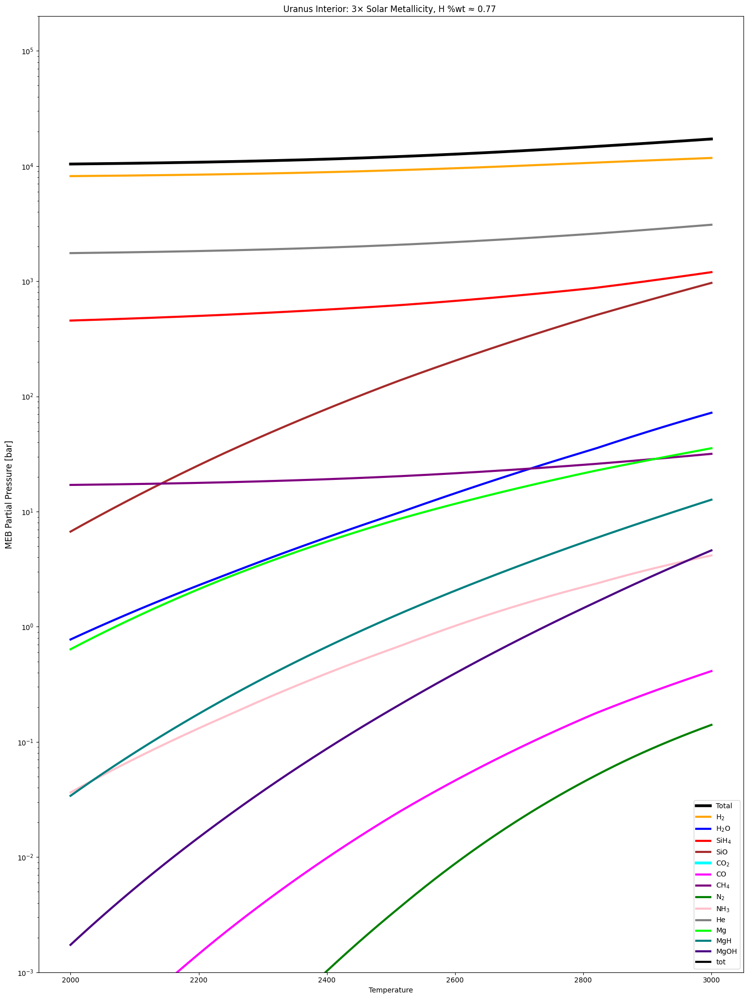

[15:55:46 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:55:46 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

1.291549665014884


[15:55:46 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:55:46 - atmodeller.classes             - INFO     ] - Solver steps (max) = 69
[15:55:47 - atmodeller.output              - INFO     ] - Writing output to excel
[15:55:47 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:55:47 - atmodeller.output              - INFO     ] - Computing asdict output
[15:55:54 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:55:54 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

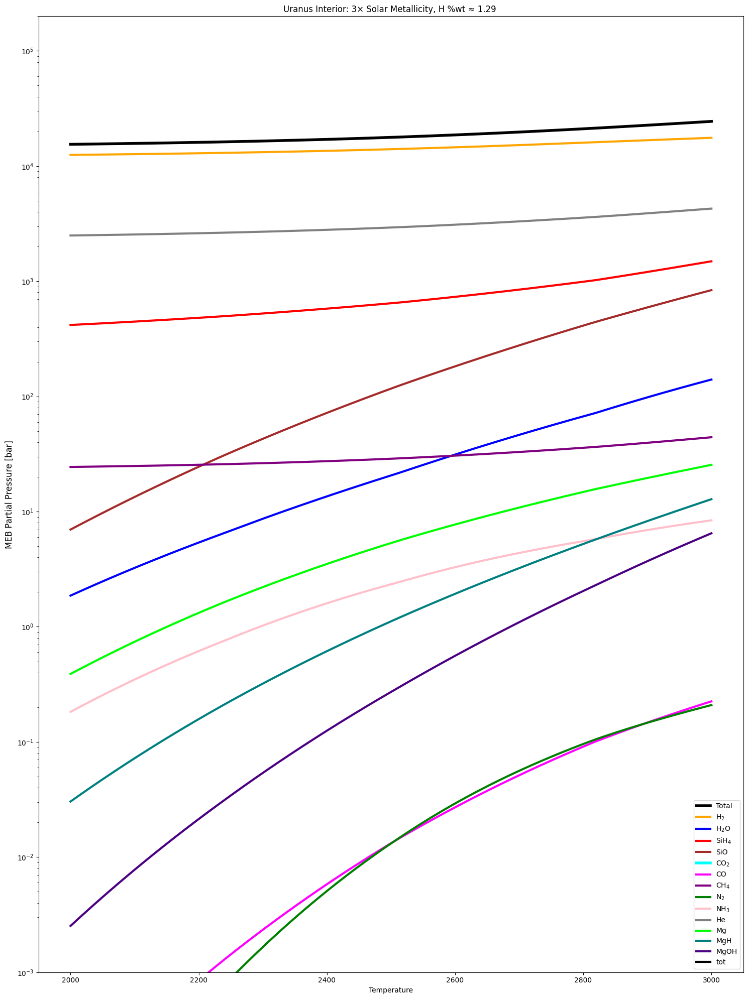

[15:56:28 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:56:28 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

2.1544346900318834


[15:56:28 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:56:28 - atmodeller.classes             - INFO     ] - Solver steps (max) = 27
[15:56:29 - atmodeller.output              - INFO     ] - Writing output to excel
[15:56:29 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:56:29 - atmodeller.output              - INFO     ] - Computing asdict output
[15:56:35 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:56:35 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

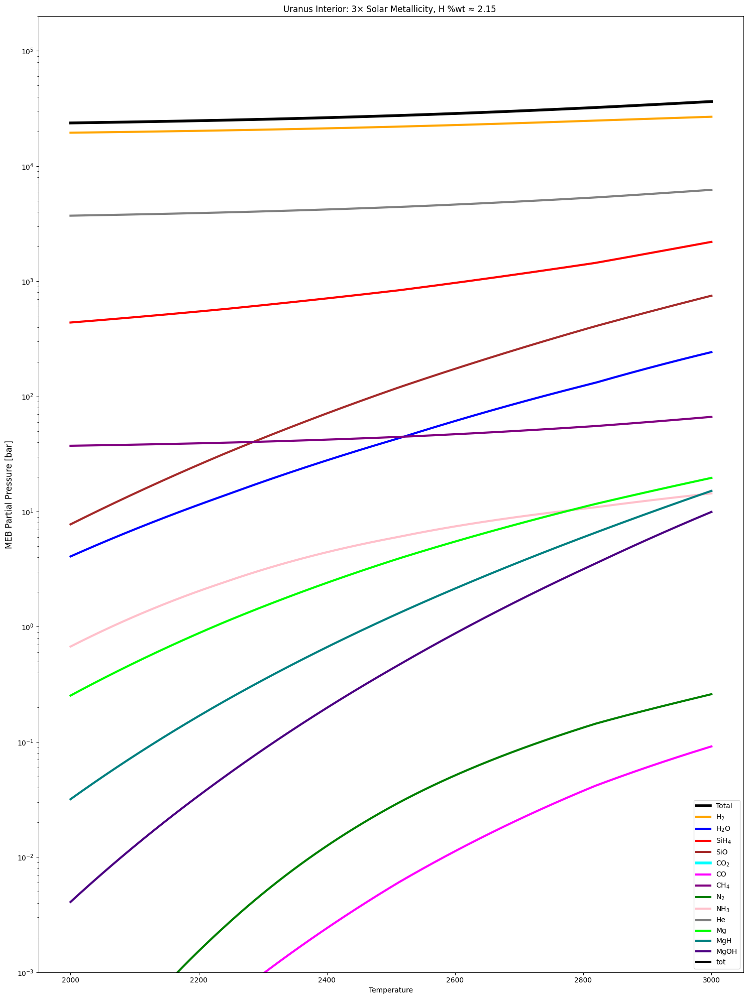

[15:57:08 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:57:08 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

3.593813663804626


[15:57:08 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:57:08 - atmodeller.classes             - INFO     ] - Solver steps (max) = 26
[15:57:09 - atmodeller.output              - INFO     ] - Writing output to excel
[15:57:09 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:57:09 - atmodeller.output              - INFO     ] - Computing asdict output
[15:57:15 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:57:15 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

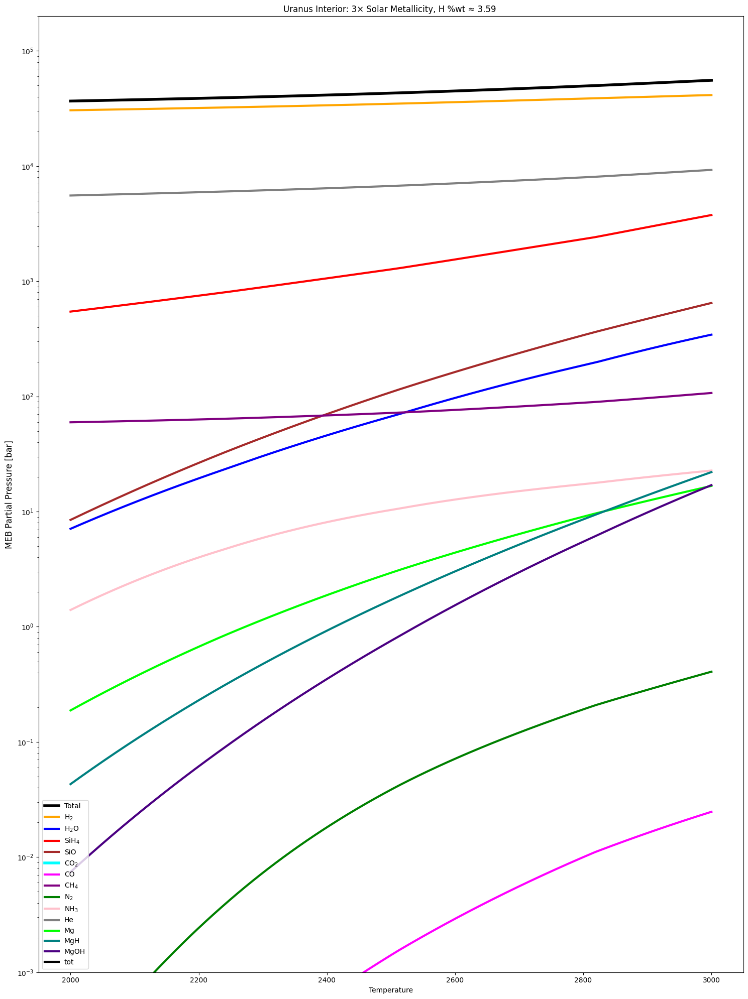

[15:57:52 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:57:52 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

5.994842503189409


[15:57:52 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:57:52 - atmodeller.classes             - INFO     ] - Solver steps (max) = 25
[15:57:53 - atmodeller.output              - INFO     ] - Writing output to excel
[15:57:53 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:57:53 - atmodeller.output              - INFO     ] - Computing asdict output
[15:57:59 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:57:59 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

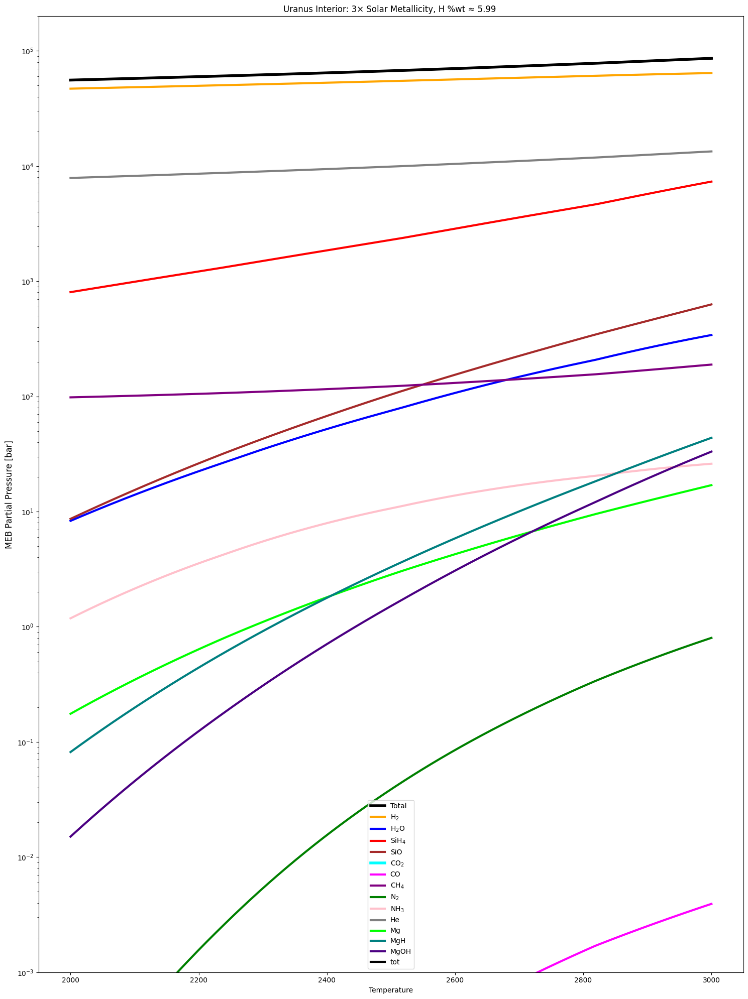

[15:58:37 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:58:37 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

10.0


[15:58:38 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:58:38 - atmodeller.classes             - INFO     ] - Solver steps (max) = 56
[15:58:39 - atmodeller.output              - INFO     ] - Writing output to excel
[15:58:39 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:58:39 - atmodeller.output              - INFO     ] - Computing asdict output
[15:58:47 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:58:47 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

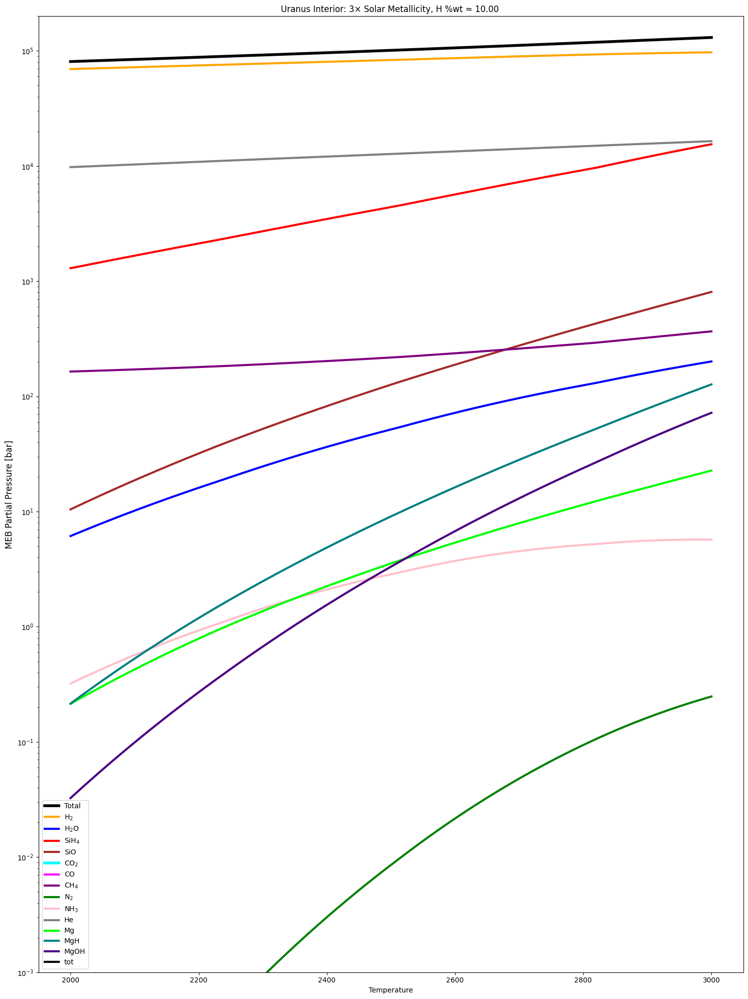

[15:59:24 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[15:59:24 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.1


[15:59:24 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[15:59:24 - atmodeller.classes             - INFO     ] - Solver steps (max) = 26
[15:59:25 - atmodeller.output              - INFO     ] - Writing output to excel
[15:59:25 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[15:59:25 - atmodeller.output              - INFO     ] - Computing asdict output
[15:59:31 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[15:59:31 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

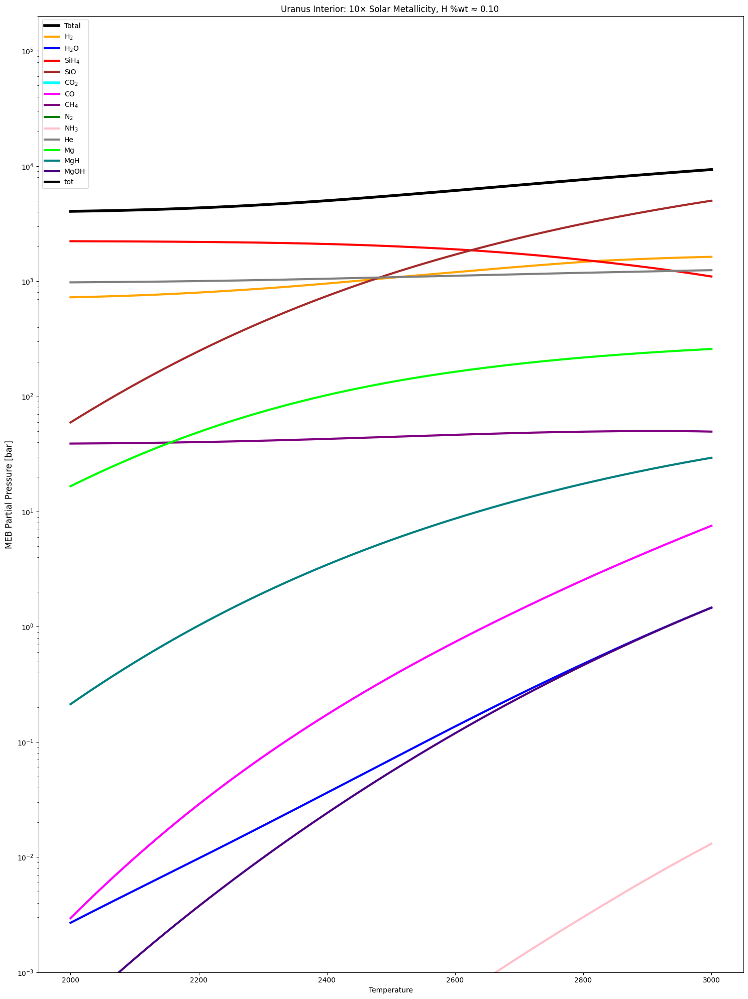

[16:00:06 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:00:06 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.16681005372000587


[16:00:08 - atmodeller.classes             - WARNING  ] - 20 model(s) failed to converge on the first attempt
[16:00:08 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[16:00:08 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[16:00:08 - atmodeller.classes             - WARNING  ] - Attempting to solve the 20 models(s) that initially failed
[16:00:08 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[16:00:12 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[16:00:13 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[16:00:13 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:00:13 - atmodeller.classes             - INFO     ] - Solver steps (max) =

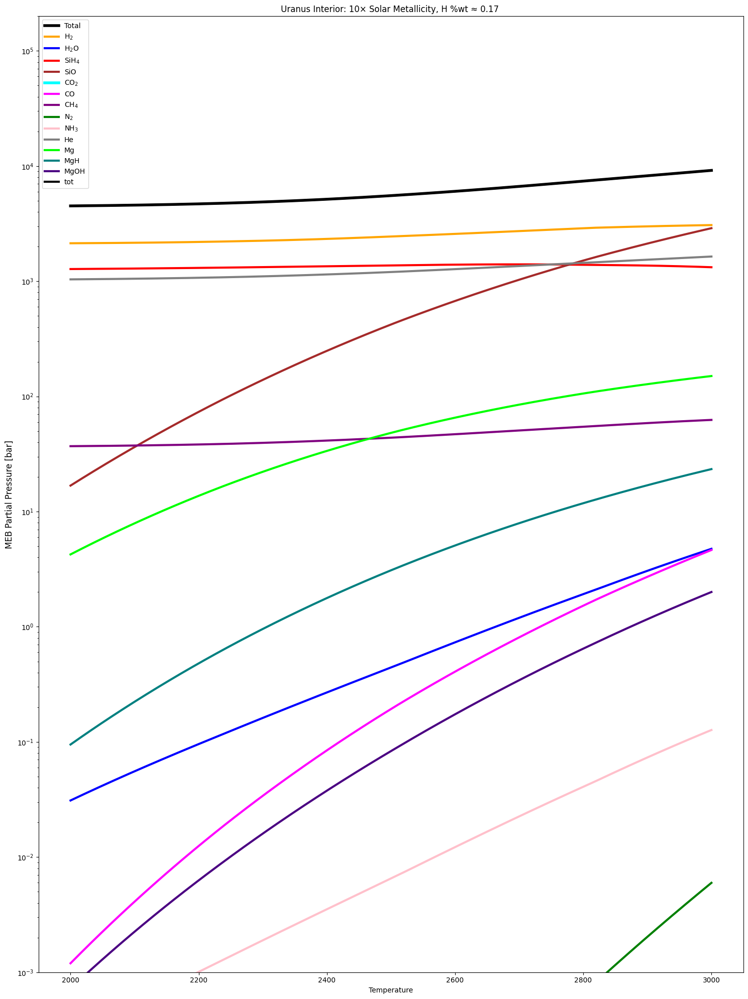

[16:00:54 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:00:54 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.2782559402207124


[16:00:57 - atmodeller.classes             - WARNING  ] - 5 model(s) failed to converge on the first attempt
[16:00:57 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[16:00:57 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[16:00:57 - atmodeller.classes             - WARNING  ] - Attempting to solve the 5 models(s) that initially failed
[16:00:57 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[16:01:01 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[16:01:01 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[16:01:01 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:01:01 - atmodeller.classes             - INFO     ] - Solver steps (max) = 1

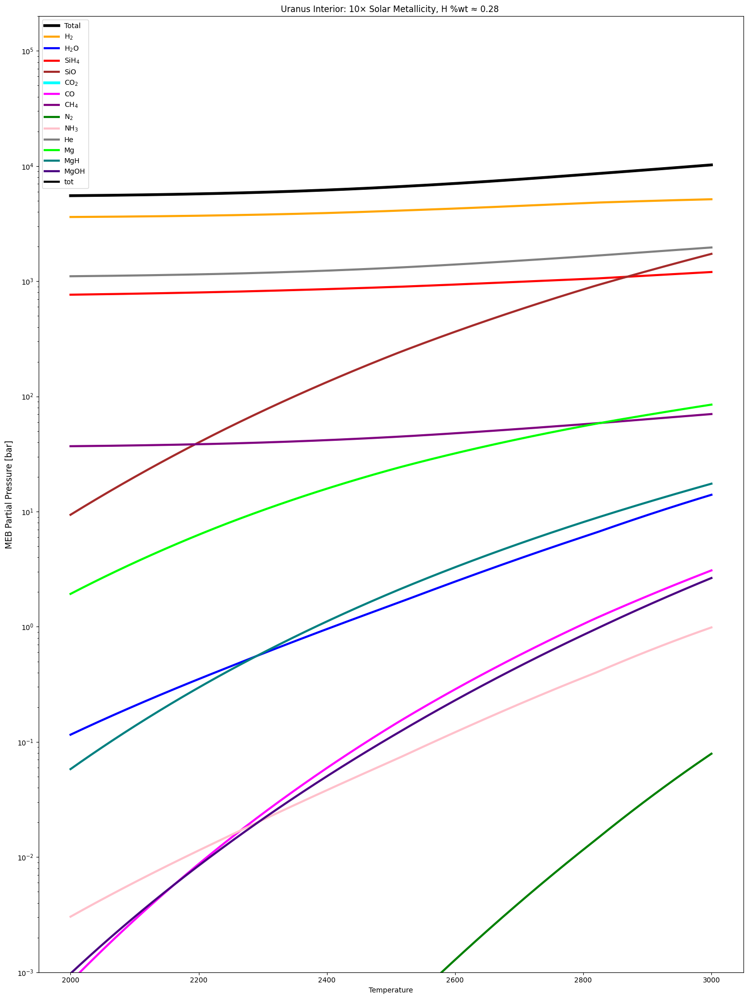

[16:01:43 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:01:43 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.46415888336127786


[16:01:44 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:01:44 - atmodeller.classes             - INFO     ] - Solver steps (max) = 125
[16:01:45 - atmodeller.output              - INFO     ] - Writing output to excel
[16:01:45 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:01:45 - atmodeller.output              - INFO     ] - Computing asdict output
[16:01:51 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:01:51 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

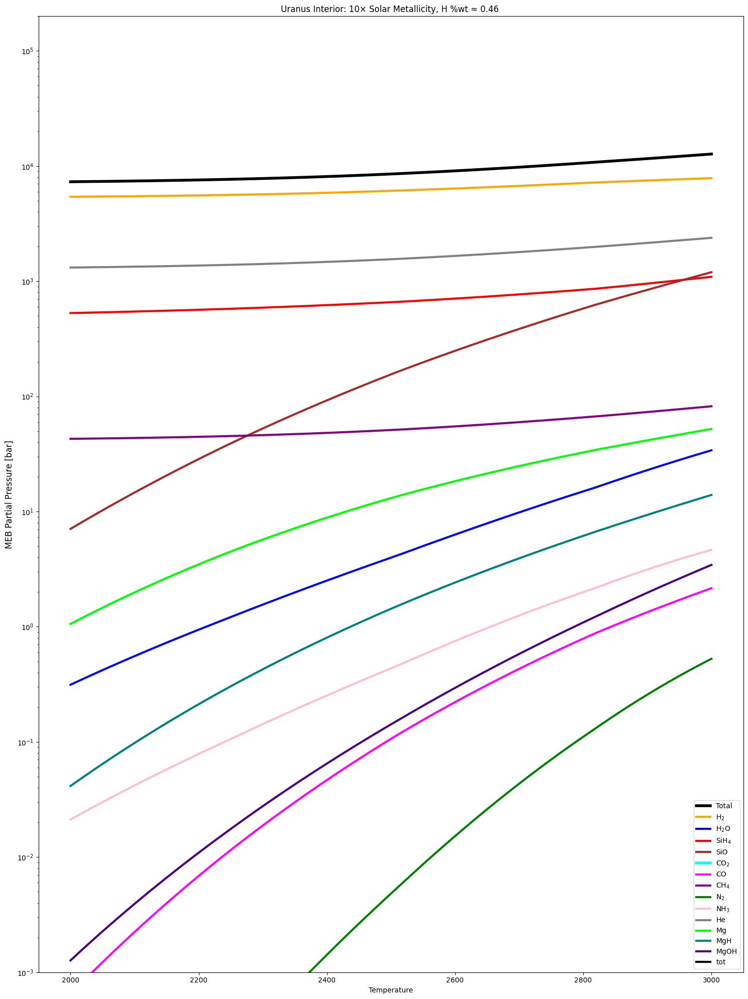

[16:02:28 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:02:28 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.774263682681127


[16:02:29 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:02:29 - atmodeller.classes             - INFO     ] - Solver steps (max) = 91
[16:02:30 - atmodeller.output              - INFO     ] - Writing output to excel
[16:02:30 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:02:30 - atmodeller.output              - INFO     ] - Computing asdict output
[16:02:37 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:02:37 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

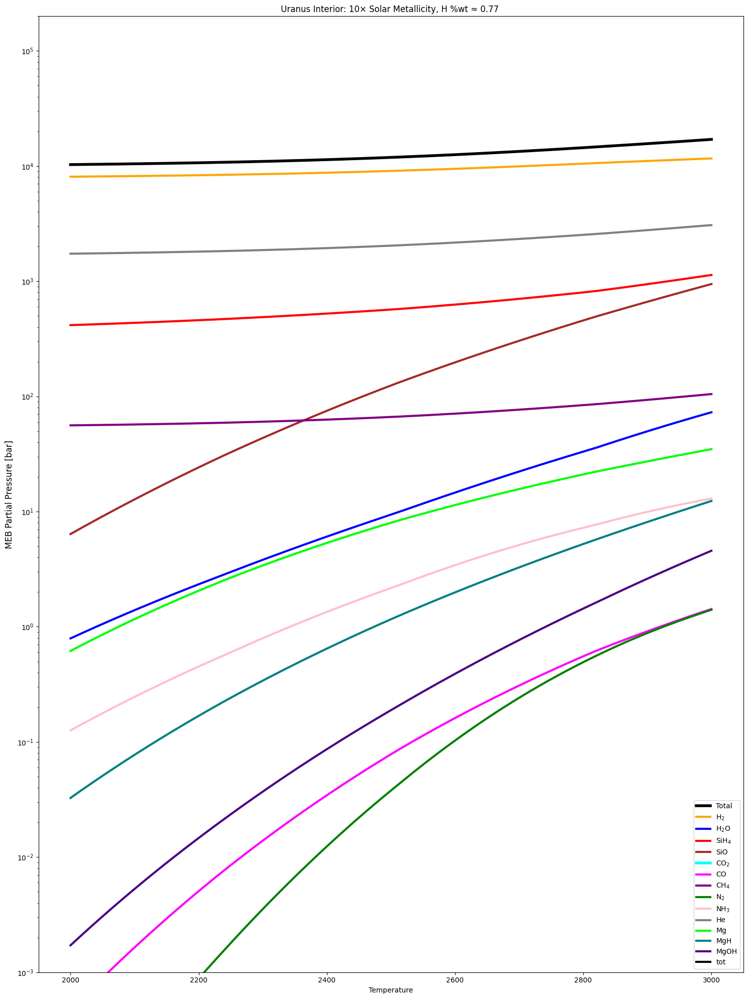

[16:03:13 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:03:13 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

1.291549665014884


[16:03:13 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:03:13 - atmodeller.classes             - INFO     ] - Solver steps (max) = 27
[16:03:14 - atmodeller.output              - INFO     ] - Writing output to excel
[16:03:14 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:03:14 - atmodeller.output              - INFO     ] - Computing asdict output
[16:03:22 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:03:22 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

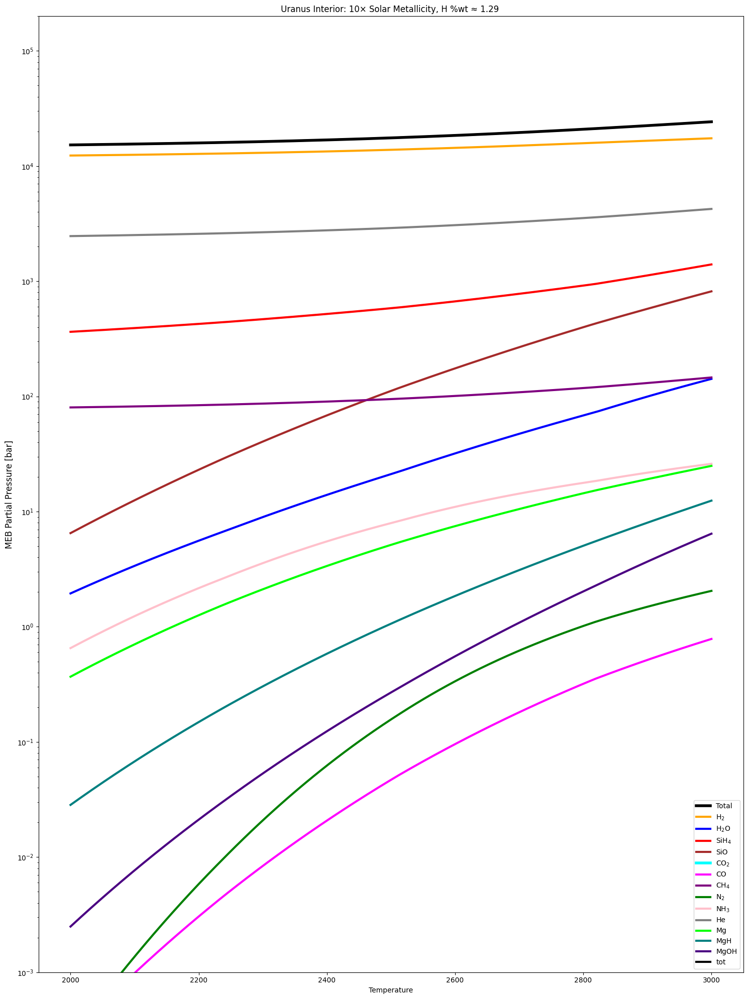

[16:03:55 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:03:55 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

2.1544346900318834


[16:03:55 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:03:55 - atmodeller.classes             - INFO     ] - Solver steps (max) = 24
[16:03:57 - atmodeller.output              - INFO     ] - Writing output to excel
[16:03:57 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:03:57 - atmodeller.output              - INFO     ] - Computing asdict output
[16:04:03 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:04:03 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

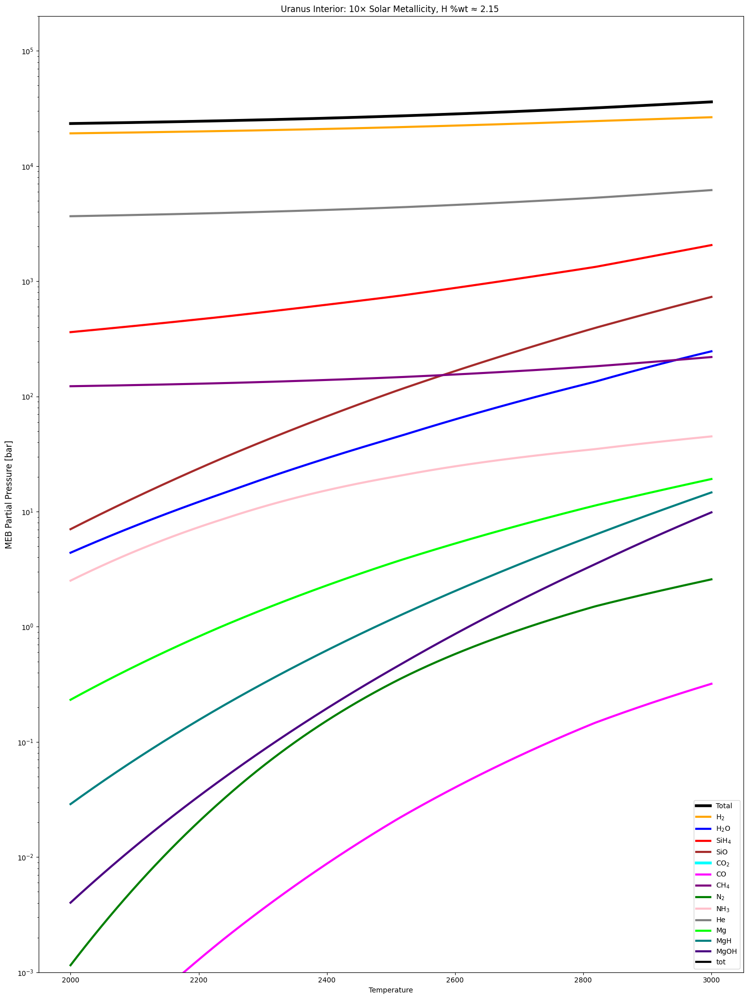

[16:04:38 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:04:38 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

3.593813663804626


[16:04:38 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:04:38 - atmodeller.classes             - INFO     ] - Solver steps (max) = 24
[16:04:39 - atmodeller.output              - INFO     ] - Writing output to excel
[16:04:39 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:04:39 - atmodeller.output              - INFO     ] - Computing asdict output
[16:04:47 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:04:47 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

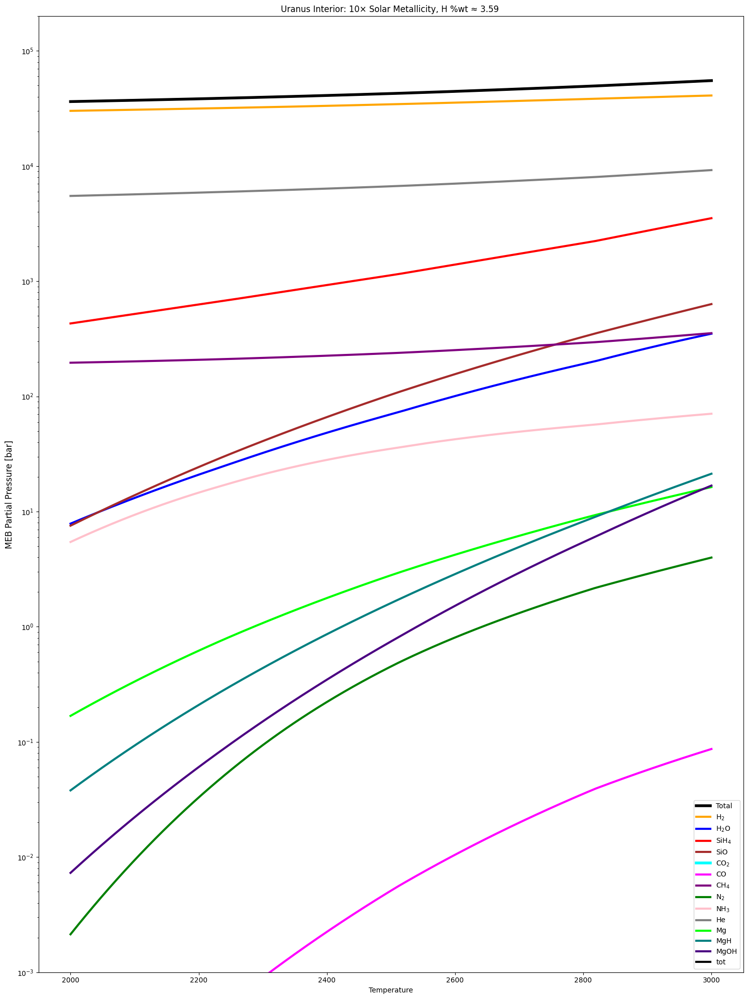

[16:05:23 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:05:23 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

5.994842503189409


[16:05:23 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:05:23 - atmodeller.classes             - INFO     ] - Solver steps (max) = 23
[16:05:25 - atmodeller.output              - INFO     ] - Writing output to excel
[16:05:25 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:05:25 - atmodeller.output              - INFO     ] - Computing asdict output
[16:05:32 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:05:32 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

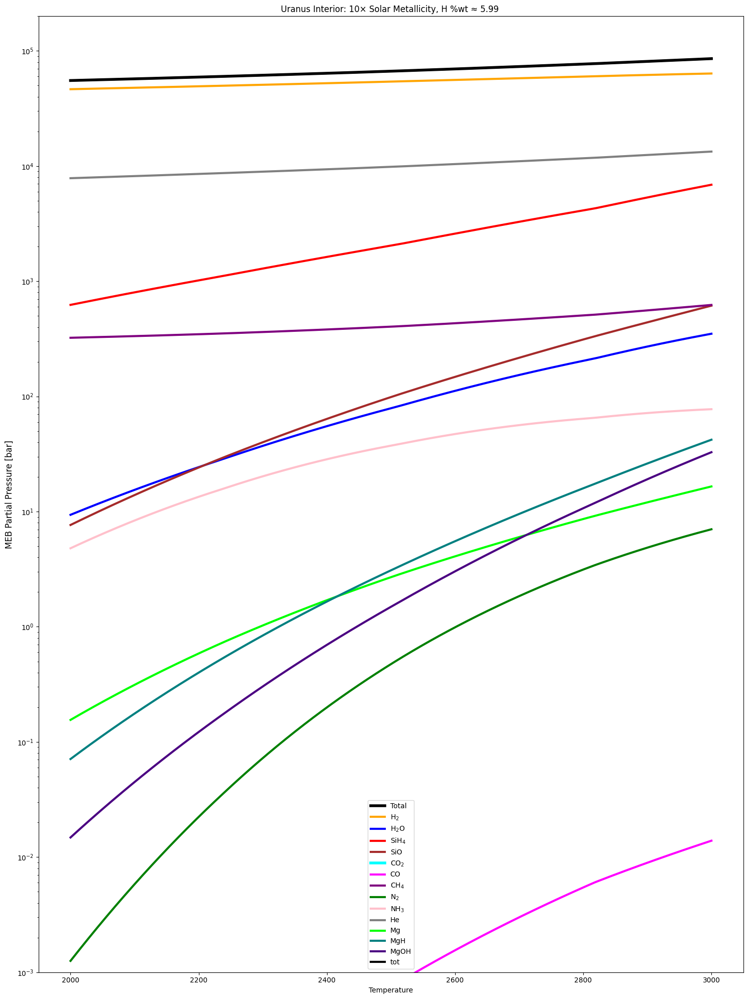

[16:06:10 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:06:10 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

10.0


[16:06:10 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:06:10 - atmodeller.classes             - INFO     ] - Solver steps (max) = 56
[16:06:12 - atmodeller.output              - INFO     ] - Writing output to excel
[16:06:12 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:06:12 - atmodeller.output              - INFO     ] - Computing asdict output
[16:06:18 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:06:18 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

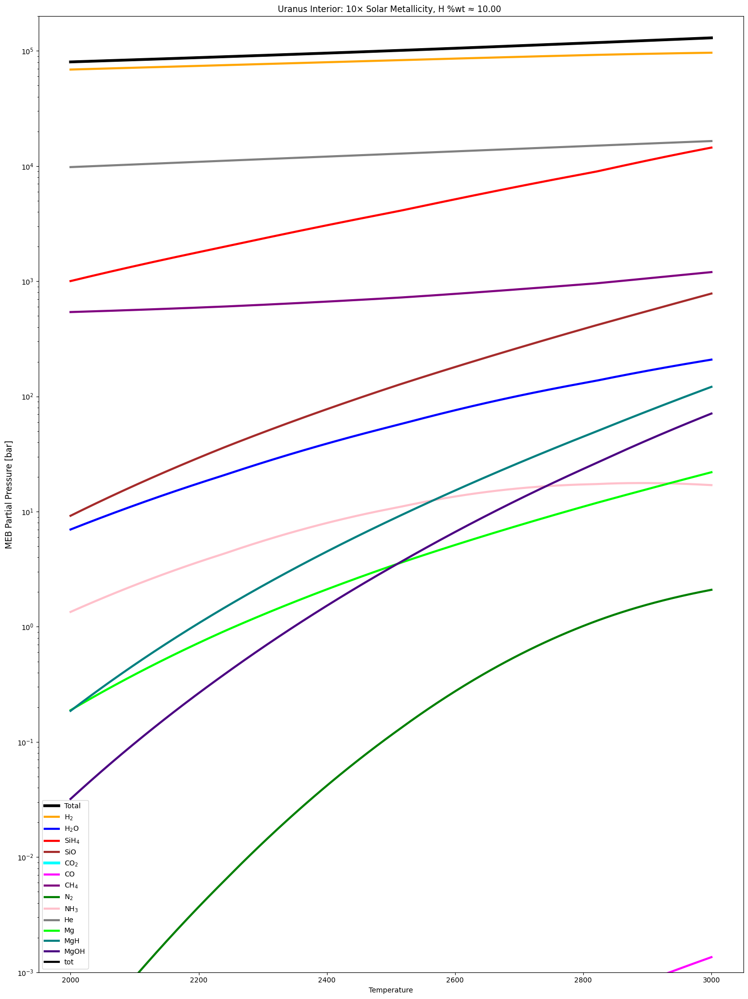

[16:06:55 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:06:55 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.1


[16:06:56 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:06:56 - atmodeller.classes             - INFO     ] - Solver steps (max) = 24
[16:06:58 - atmodeller.output              - INFO     ] - Writing output to excel
[16:06:58 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:06:58 - atmodeller.output              - INFO     ] - Computing asdict output
[16:07:04 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:07:04 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

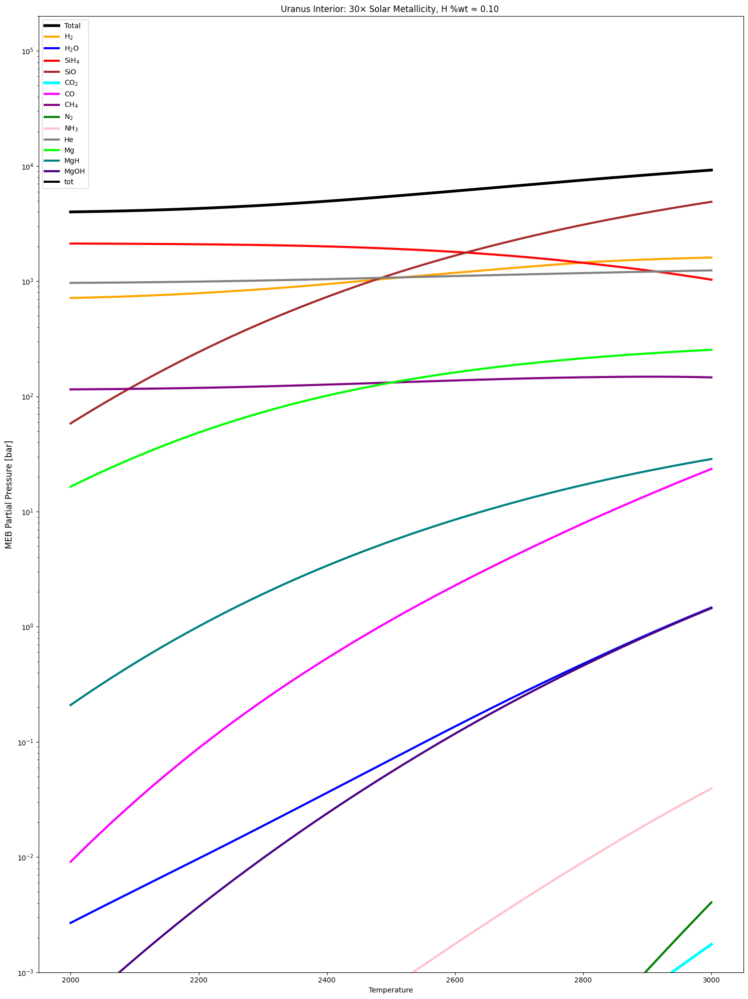

[16:07:41 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:07:41 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.16681005372000587


[16:07:42 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:07:42 - atmodeller.classes             - INFO     ] - Solver steps (max) = 118
[16:07:43 - atmodeller.output              - INFO     ] - Writing output to excel
[16:07:43 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:07:43 - atmodeller.output              - INFO     ] - Computing asdict output
[16:07:50 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:07:50 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

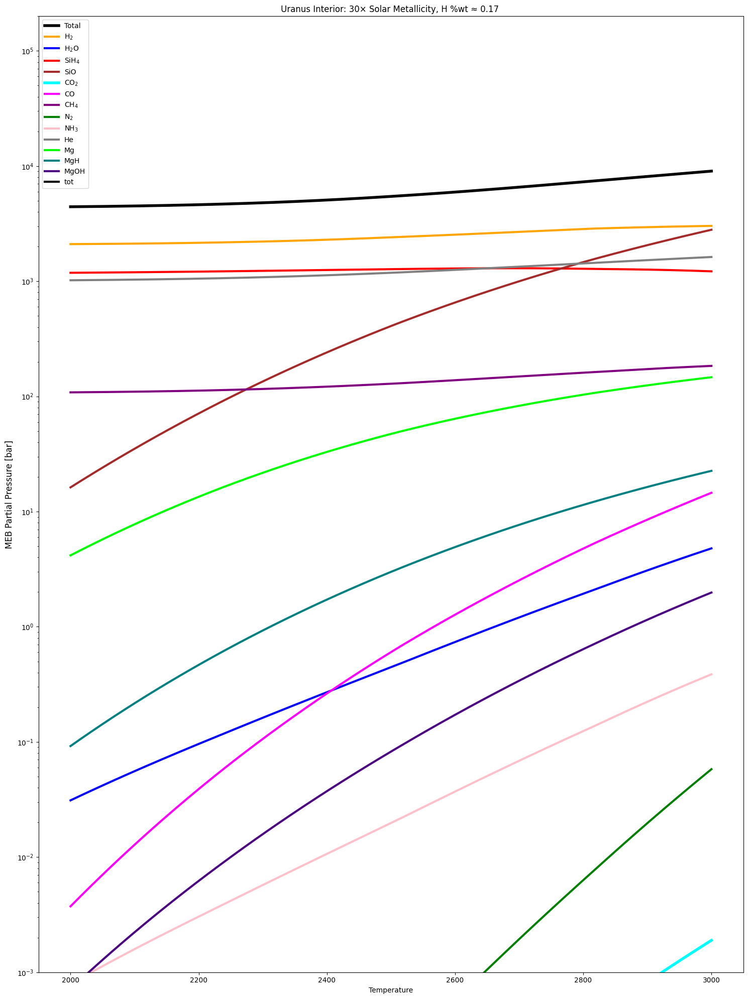

[16:08:24 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:08:24 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.2782559402207124


[16:08:27 - atmodeller.classes             - WARNING  ] - 3 model(s) failed to converge on the first attempt
[16:08:27 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[16:08:27 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[16:08:27 - atmodeller.classes             - WARNING  ] - Attempting to solve the 3 models(s) that initially failed
[16:08:27 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[16:08:32 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[16:08:32 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[16:08:32 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:08:32 - atmodeller.classes             - INFO     ] - Solver steps (max) = 1

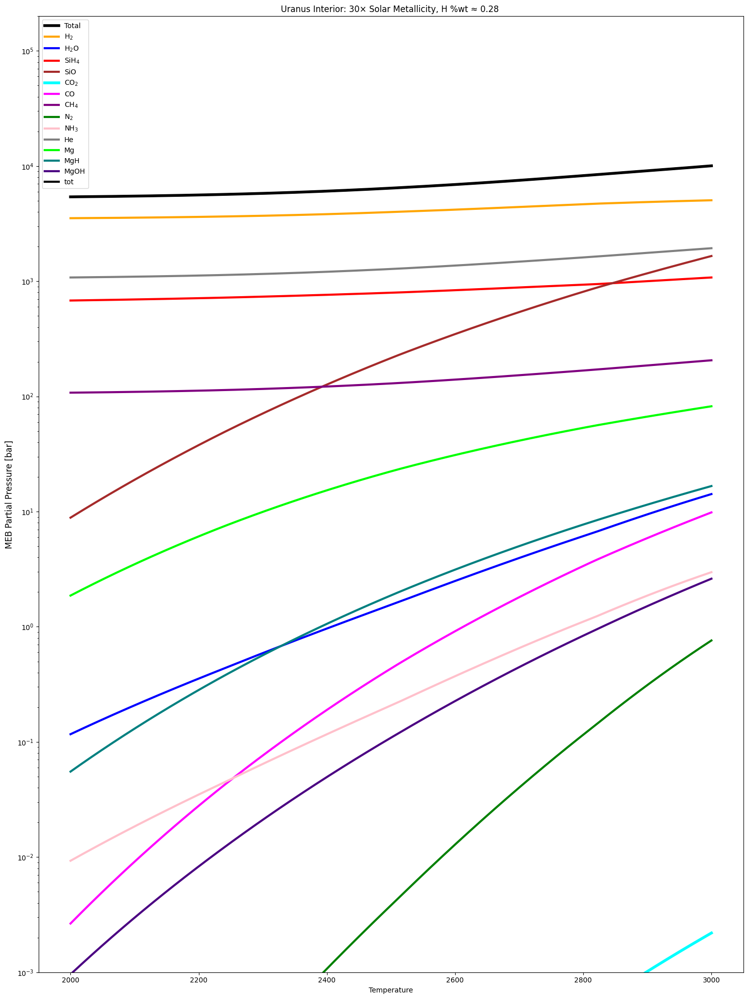

[16:09:17 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:09:17 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.46415888336127786


[16:09:18 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:09:18 - atmodeller.classes             - INFO     ] - Solver steps (max) = 141
[16:09:19 - atmodeller.output              - INFO     ] - Writing output to excel
[16:09:19 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:09:19 - atmodeller.output              - INFO     ] - Computing asdict output
[16:09:25 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:09:25 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

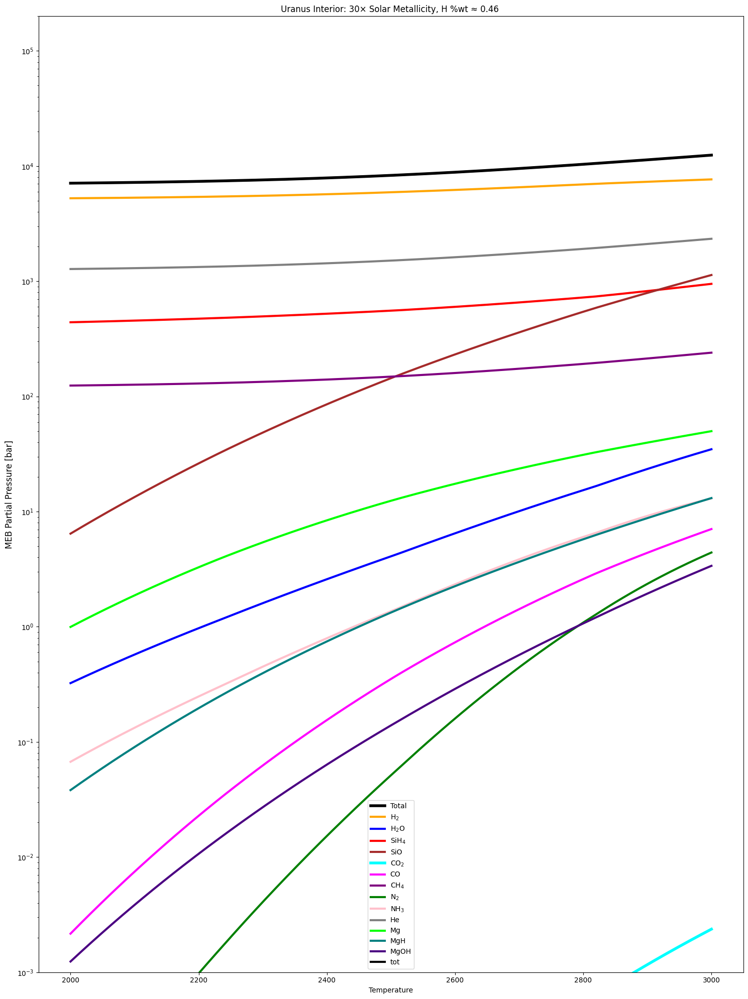

[16:10:02 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:10:02 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.774263682681127


[16:10:03 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:10:03 - atmodeller.classes             - INFO     ] - Solver steps (max) = 127
[16:10:04 - atmodeller.output              - INFO     ] - Writing output to excel
[16:10:04 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:10:04 - atmodeller.output              - INFO     ] - Computing asdict output
[16:10:10 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:10:10 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

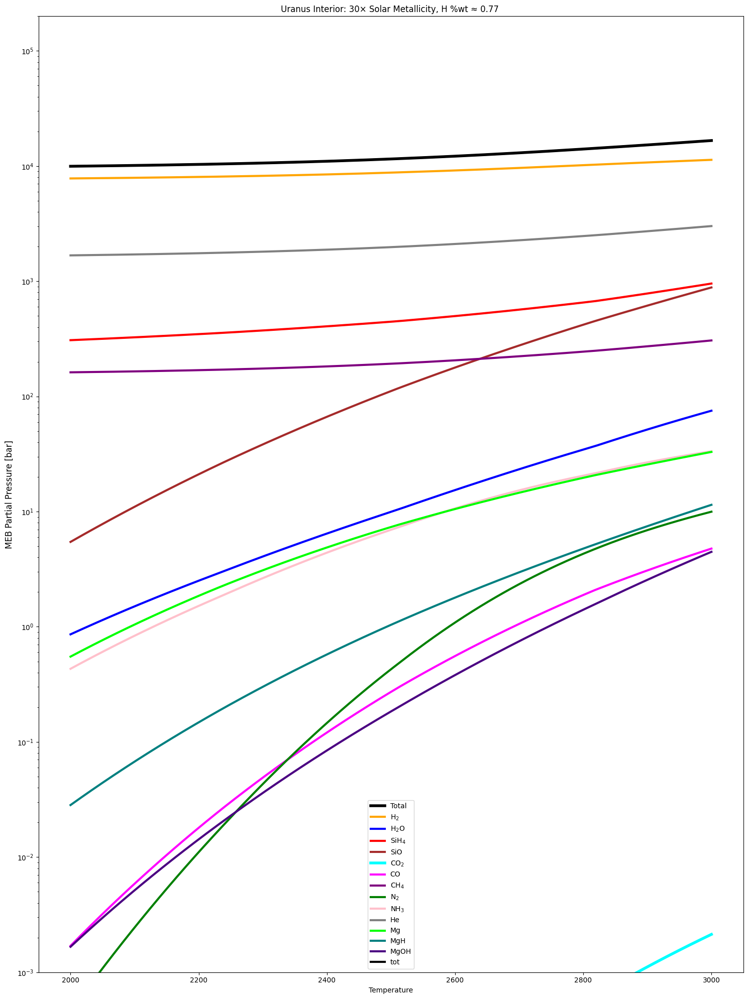

[16:10:47 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:10:47 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

1.291549665014884


[16:10:48 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:10:48 - atmodeller.classes             - INFO     ] - Solver steps (max) = 111
[16:10:51 - atmodeller.output              - INFO     ] - Writing output to excel
[16:10:51 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:10:51 - atmodeller.output              - INFO     ] - Computing asdict output
[16:10:58 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:10:58 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

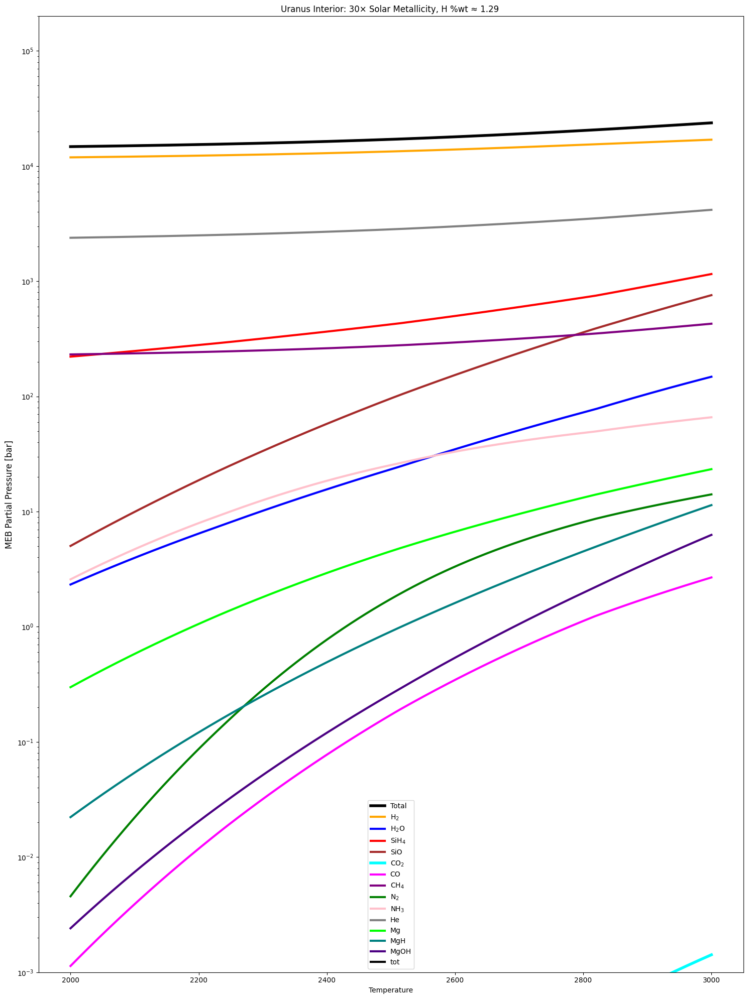

[16:11:35 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:11:35 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

2.1544346900318834


[16:11:36 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:11:36 - atmodeller.classes             - INFO     ] - Solver steps (max) = 25
[16:11:37 - atmodeller.output              - INFO     ] - Writing output to excel
[16:11:37 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:11:37 - atmodeller.output              - INFO     ] - Computing asdict output
[16:11:44 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:11:44 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

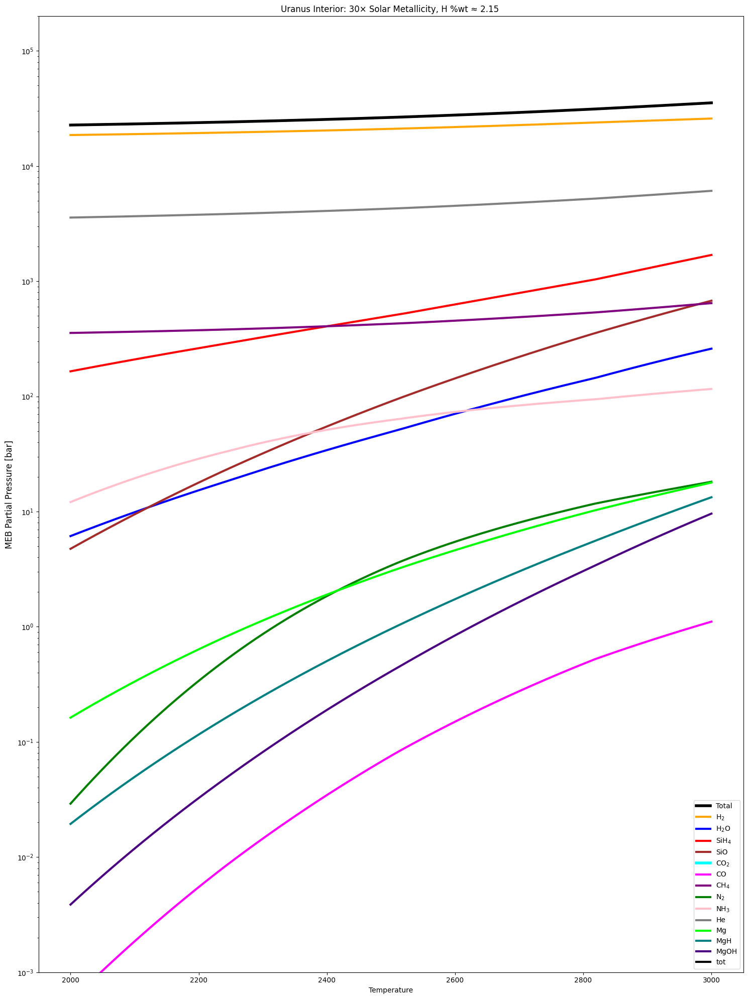

[16:12:20 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:12:20 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

3.593813663804626


[16:12:22 - atmodeller.output              - INFO     ] - Writing output to excel
[16:12:22 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:12:22 - atmodeller.output              - INFO     ] - Computing asdict output
[16:12:30 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:12:30 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libourel03', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, SolubilityPowerLaw', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMg

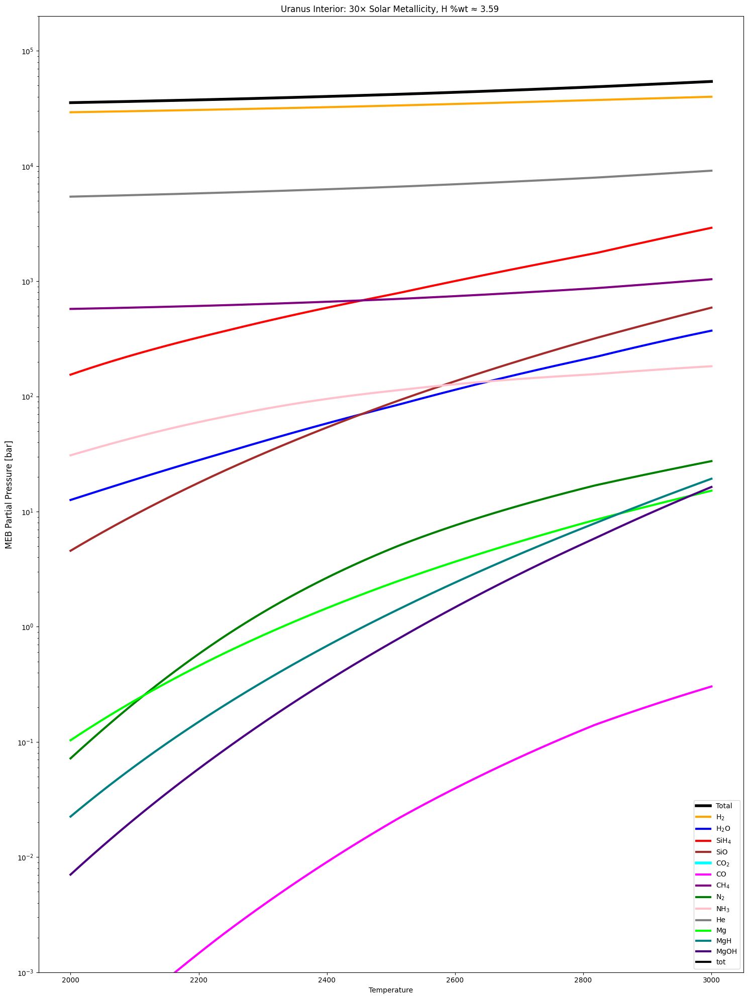

[16:13:07 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:13:07 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

5.994842503189409


[16:13:08 - atmodeller.output              - INFO     ] - Writing output to excel
[16:13:08 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:13:08 - atmodeller.output              - INFO     ] - Computing asdict output
[16:13:14 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:13:14 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libourel03', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, SolubilityPowerLaw', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMg

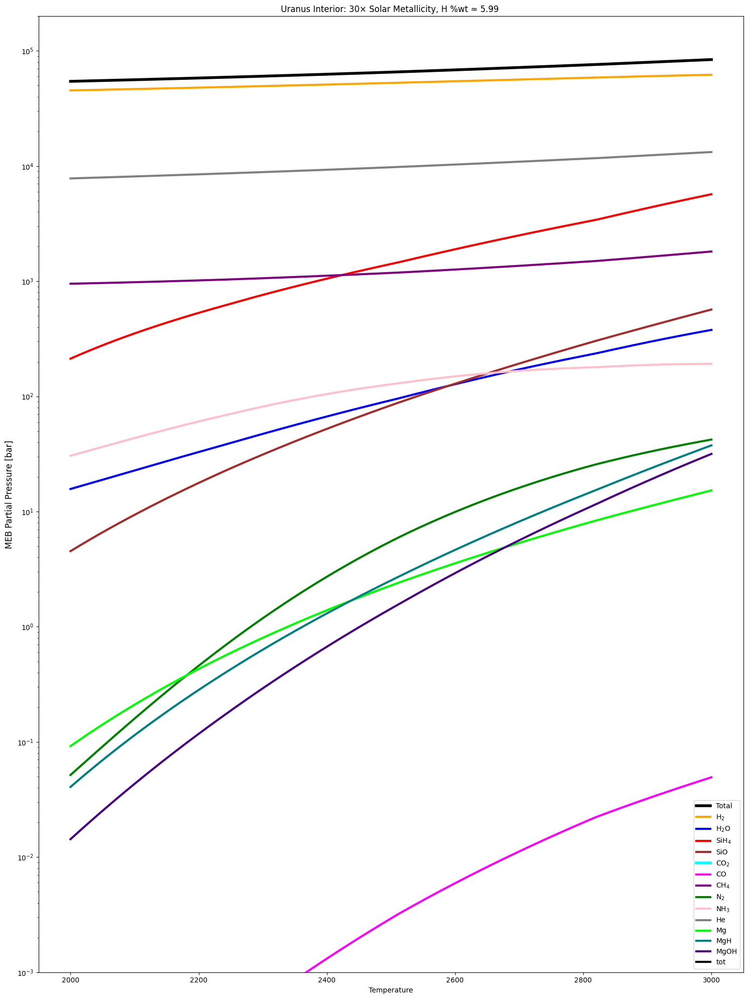

[16:13:54 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:13:54 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

10.0


[16:13:54 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:13:54 - atmodeller.classes             - INFO     ] - Solver steps (max) = 56
[16:13:56 - atmodeller.output              - INFO     ] - Writing output to excel
[16:13:56 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:13:56 - atmodeller.output              - INFO     ] - Computing asdict output
[16:14:03 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:14:03 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

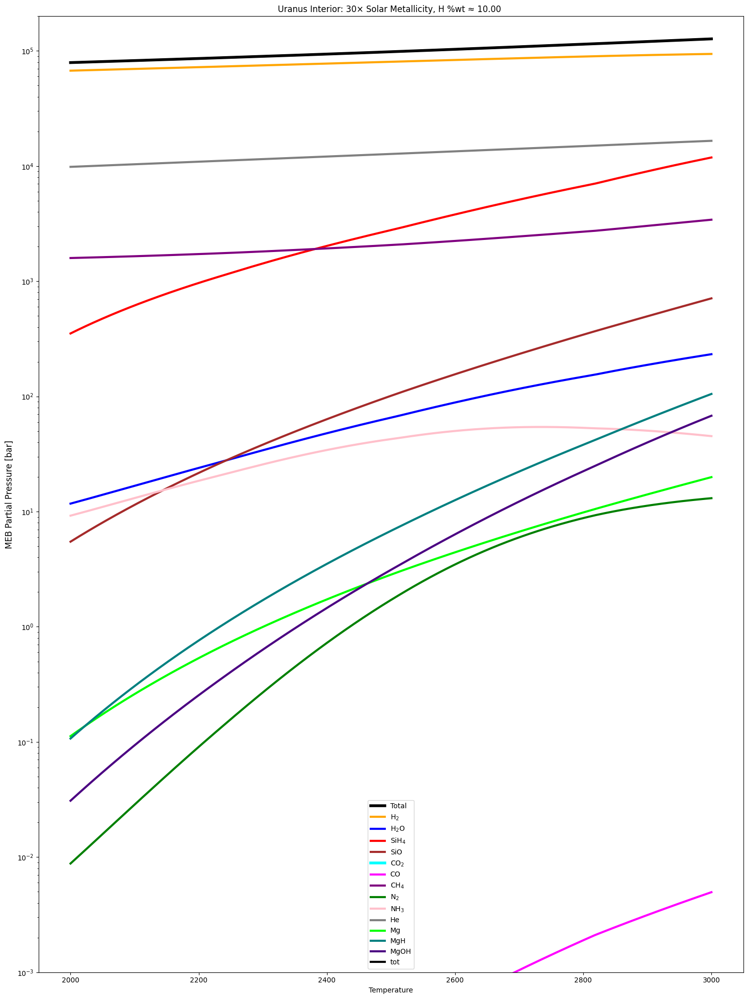

[16:14:45 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:14:45 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.1


[16:14:45 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:14:45 - atmodeller.classes             - INFO     ] - Solver steps (max) = 23
[16:14:47 - atmodeller.output              - INFO     ] - Writing output to excel
[16:14:47 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:14:47 - atmodeller.output              - INFO     ] - Computing asdict output
[16:14:53 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:14:53 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

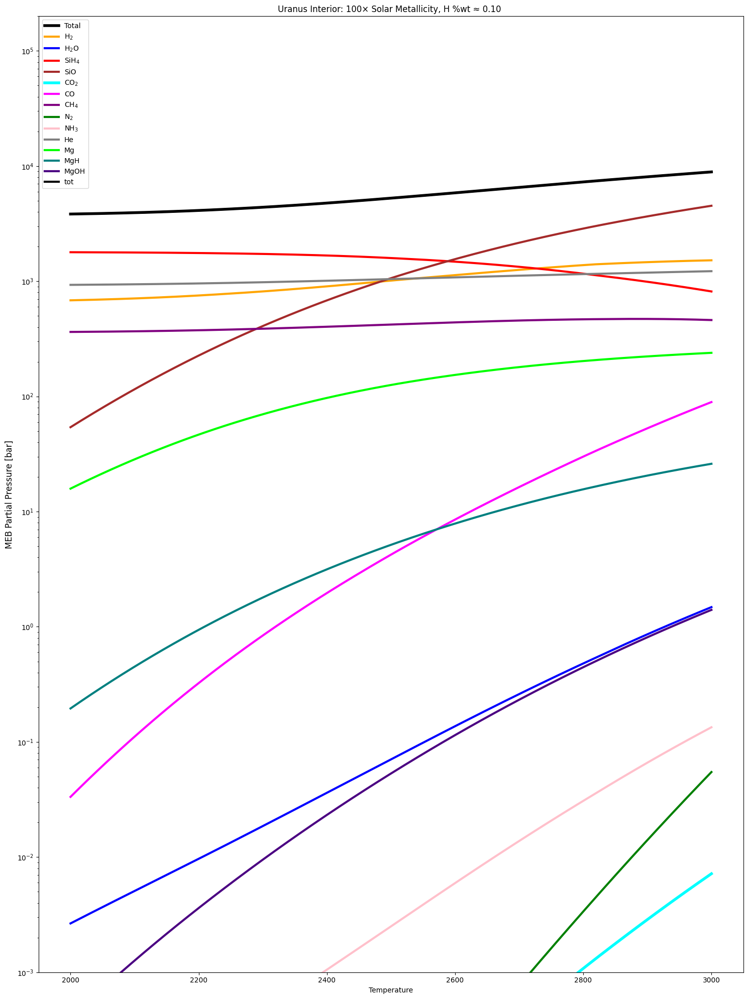

[16:15:29 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:15:29 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.16681005372000587


[16:15:30 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:15:30 - atmodeller.classes             - INFO     ] - Solver steps (max) = 174
[16:15:31 - atmodeller.output              - INFO     ] - Writing output to excel
[16:15:31 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:15:31 - atmodeller.output              - INFO     ] - Computing asdict output
[16:15:38 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:15:38 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libou

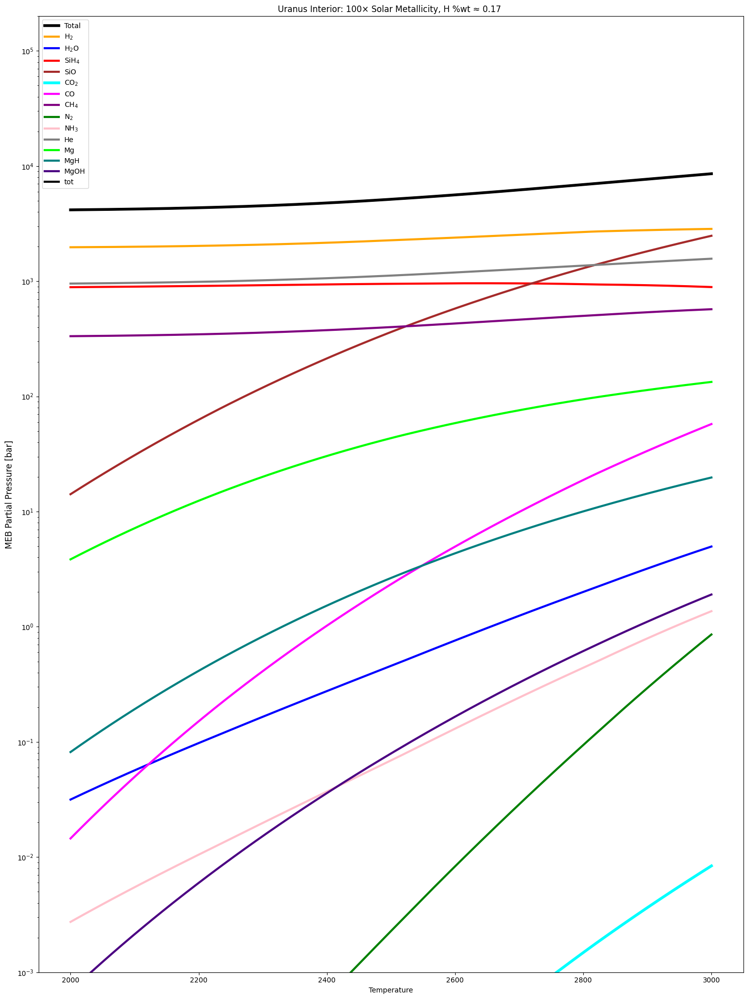

[16:16:14 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:16:14 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.2782559402207124


[16:16:17 - atmodeller.classes             - WARNING  ] - 19 model(s) failed to converge on the first attempt
[16:16:17 - atmodeller.classes             - WARNING  ] - But don't panic! This can happen when starting from a poor initial guess.
[16:16:17 - atmodeller.classes             - WARNING  ] - Launching multistart (maximum 10 attempts)
[16:16:17 - atmodeller.classes             - WARNING  ] - Attempting to solve the 19 models(s) that initially failed
[16:16:17 - atmodeller.classes             - INFO     ] - Multistart with species' stability (TAU_MAX= 1.0e-03, TAU= 1.0e-25, TAU_NUM= 2)
[16:16:22 - atmodeller.classes             - INFO     ] - Multistart complete with 1 total attempt(s)
[16:16:22 - atmodeller.classes             - INFO     ] - Multistart, max attempts: 1, model count: 500 (100.00%)
[16:16:22 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:16:22 - atmodeller.classes             - INFO     ] - Solver steps (max) =

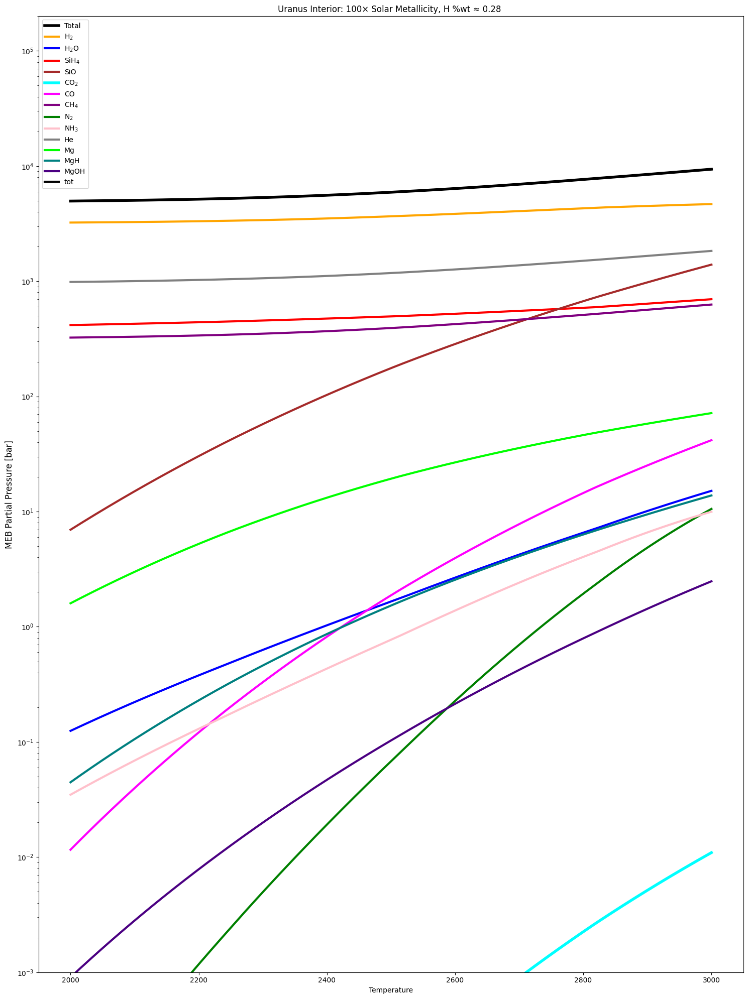

[16:17:05 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:17:05 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.46415888336127786


[16:17:05 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:17:05 - atmodeller.classes             - INFO     ] - Solver steps (max) = 26
[16:17:07 - atmodeller.output              - INFO     ] - Writing output to excel
[16:17:07 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:17:07 - atmodeller.output              - INFO     ] - Computing asdict output
[16:17:13 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:17:13 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

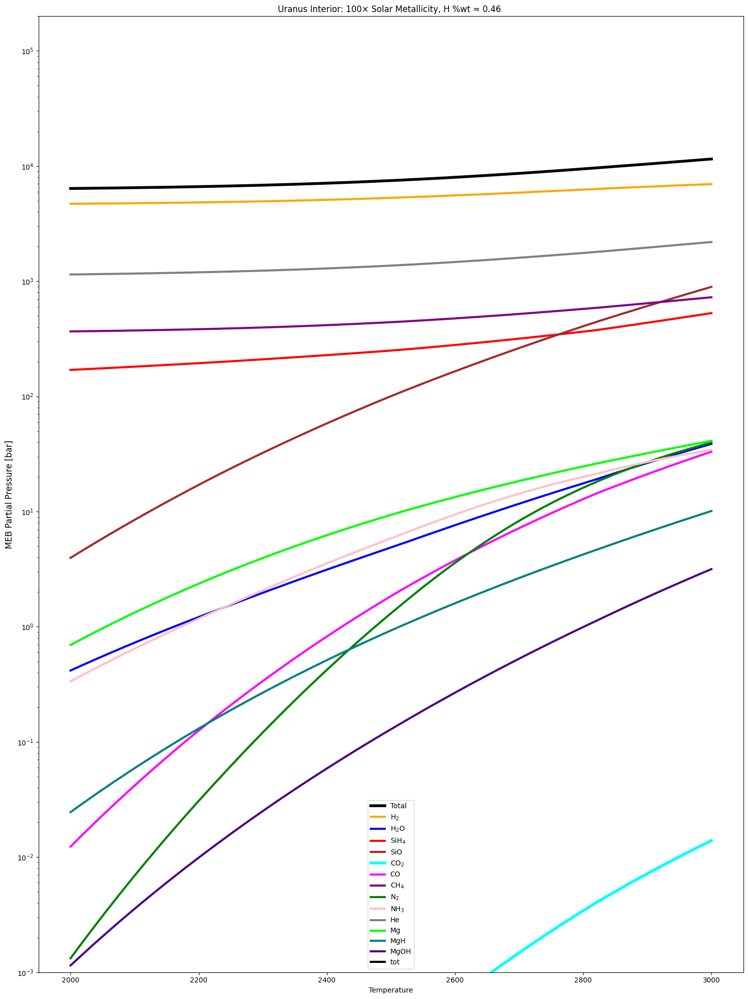

[16:17:48 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:17:48 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

0.774263682681127


[16:17:48 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:17:48 - atmodeller.classes             - INFO     ] - Solver steps (max) = 24
[16:17:49 - atmodeller.output              - INFO     ] - Writing output to excel
[16:17:49 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:17:49 - atmodeller.output              - INFO     ] - Computing asdict output
[16:17:57 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:17:57 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

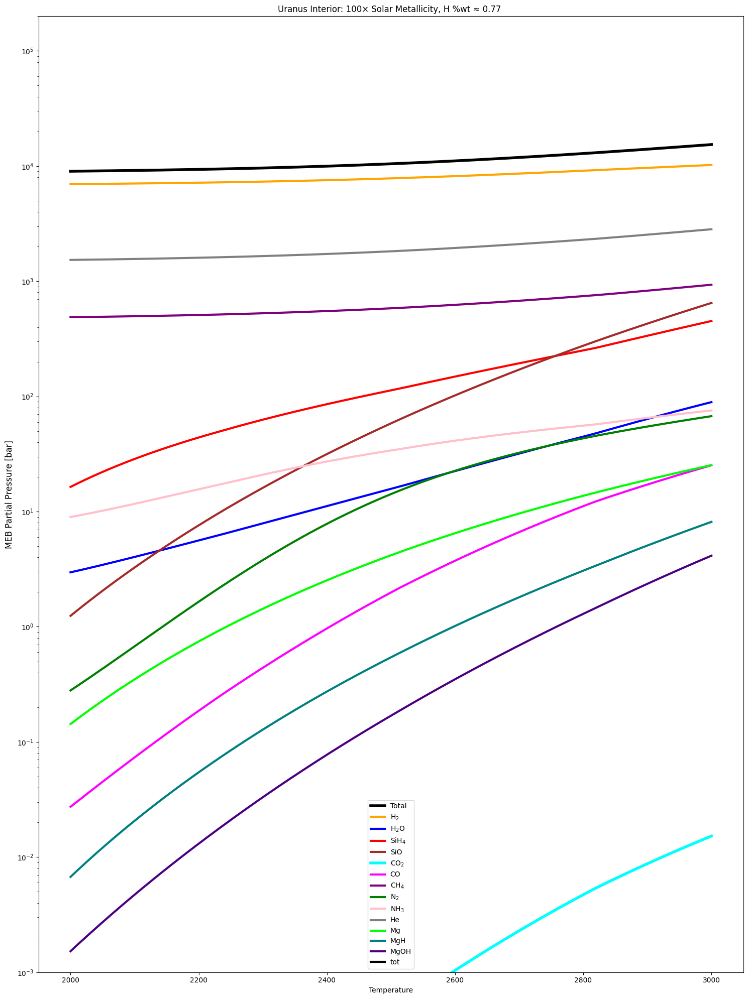

[16:18:32 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:18:32 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

1.291549665014884


[16:18:32 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:18:32 - atmodeller.classes             - INFO     ] - Solver steps (max) = 22
[16:18:33 - atmodeller.output              - INFO     ] - Writing output to excel
[16:18:33 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:18:33 - atmodeller.output              - INFO     ] - Computing asdict output
[16:18:40 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:18:40 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

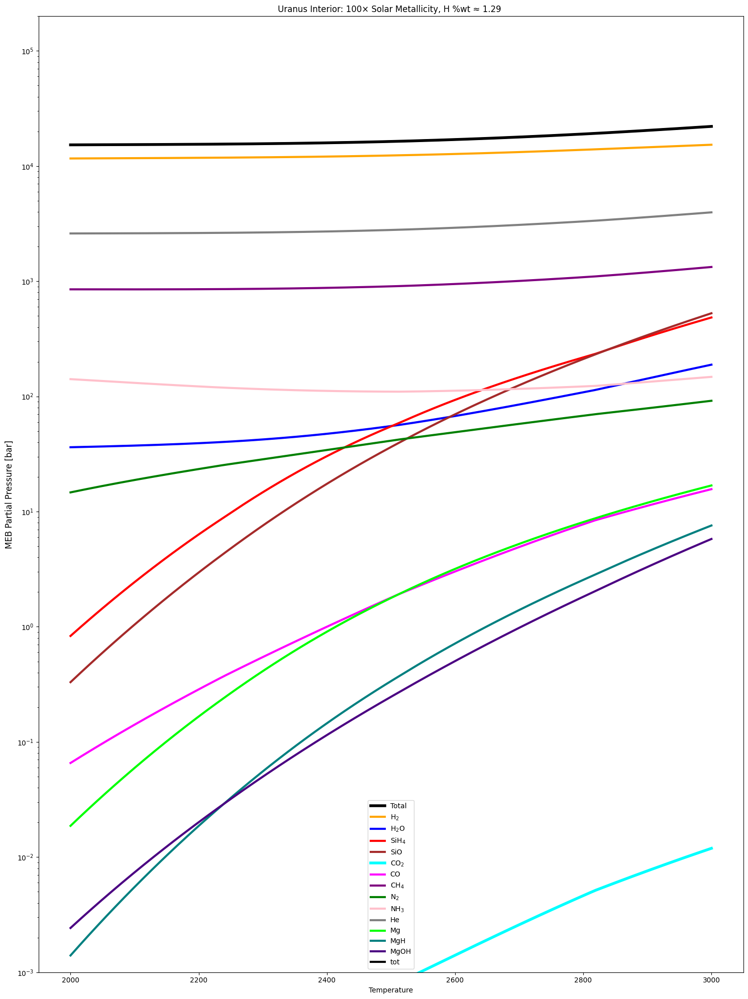

[16:19:14 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:19:14 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

2.1544346900318834


[16:19:15 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:19:15 - atmodeller.classes             - INFO     ] - Solver steps (max) = 22
[16:19:16 - atmodeller.output              - INFO     ] - Writing output to excel
[16:19:16 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:19:16 - atmodeller.output              - INFO     ] - Computing asdict output
[16:19:22 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:19:22 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

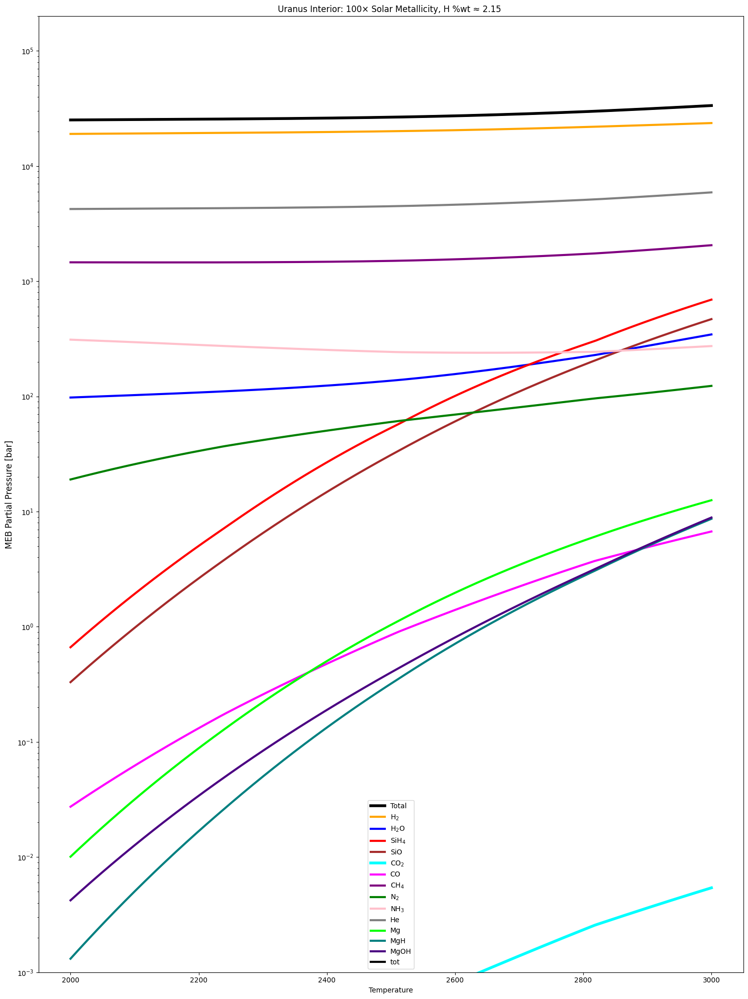

[16:19:57 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:19:57 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

3.593813663804626


[16:19:57 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:19:57 - atmodeller.classes             - INFO     ] - Solver steps (max) = 21
[16:19:58 - atmodeller.output              - INFO     ] - Writing output to excel
[16:19:58 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:19:58 - atmodeller.output              - INFO     ] - Computing asdict output
[16:20:04 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:20:04 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

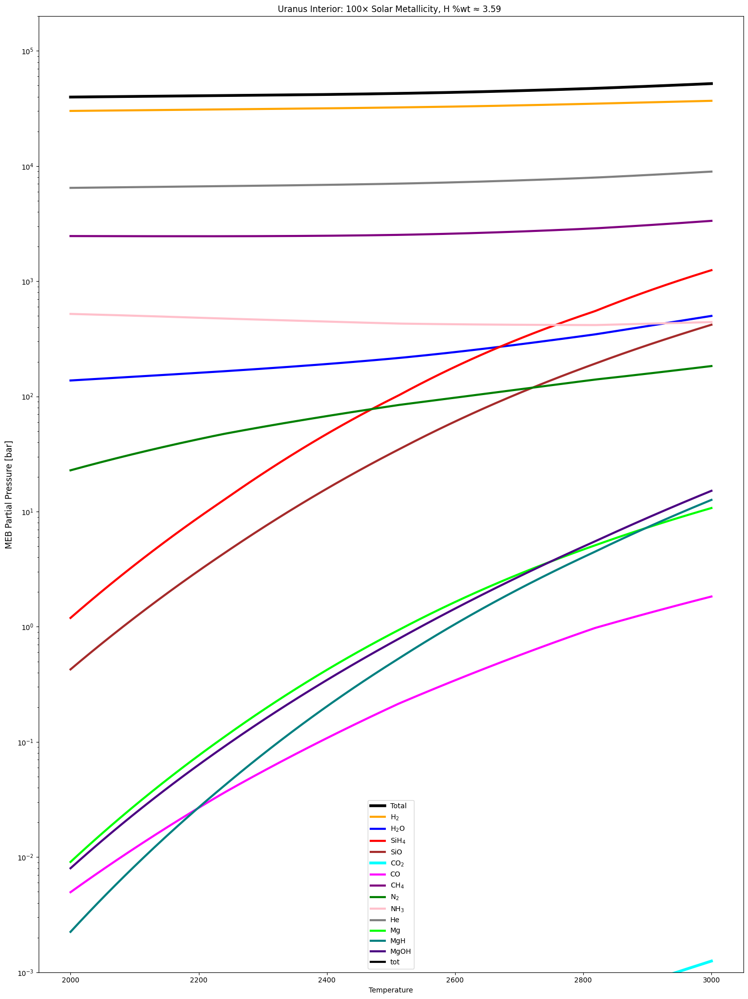

[16:20:41 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:20:41 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

5.994842503189409


[16:20:41 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:20:41 - atmodeller.classes             - INFO     ] - Solver steps (max) = 21
[16:20:42 - atmodeller.output              - INFO     ] - Writing output to excel
[16:20:42 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:20:42 - atmodeller.output              - INFO     ] - Computing asdict output
[16:20:49 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:20:49 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

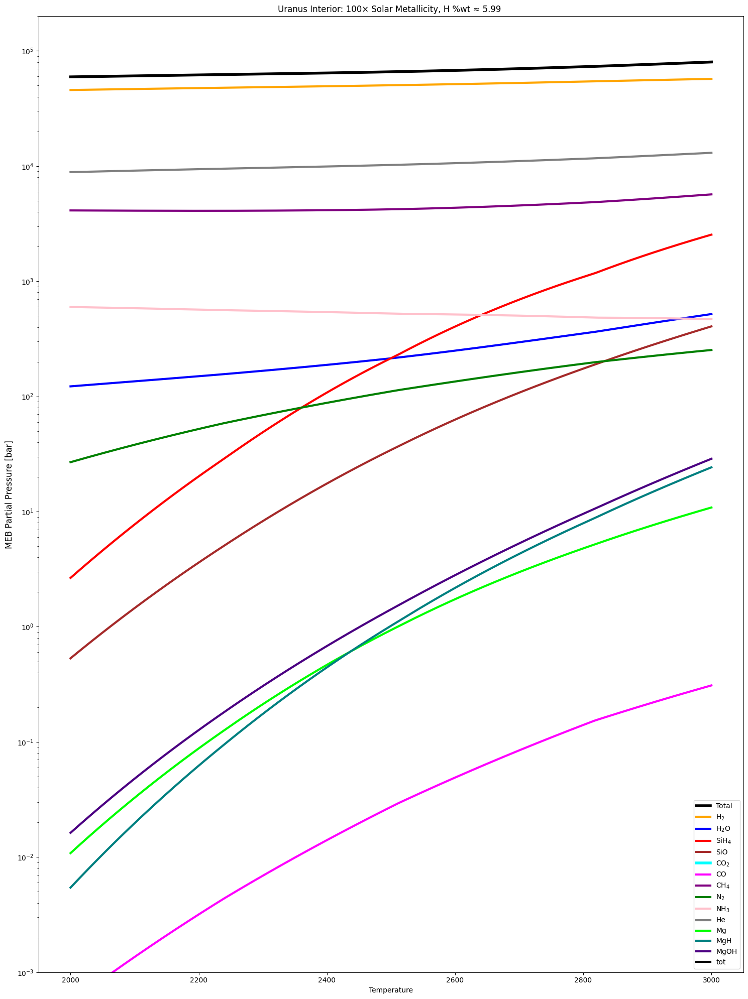

[16:21:28 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, NoSolubility', 'H2_g: IdealGas, NoSolubility', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, NoSolubility', 'CO_g: IdealGas, NoSolubility', 'CH4_g: IdealGas, NoSolubility', 'N2_g: IdealGas, NoSolubility', 'H3N_g: IdealGas, NoSolubility', 'He_g: IdealGas, NoSolubility', 'Mg_g: IdealGas, NoSolubility', 'MgO_l: CondensateActivity, NoSolubility', 'HMg_g: IdealGas, NoSolubility', 'HMgO_g: IdealGas, NoSolubility')
[16:21:28 - atmodeller.classes             - INFO     ] - reactions = {0: '1.0 H2_g + 1.0 CO2_g = 1.0 H2O_g + 1.0 CO_g',
 1: '4.0 H2_g + 1.0 CO2_g = 2.0 H2O_g + 1.0 CH4_g',
 2: '4.0 H2_g + 1.0 O2Si_l = 2.0 H2O_g + 1.0 H4Si_g',
 3: '1.5 H2_g + 0.5 N2_g = 1.0 H3N_g',
 4: '2.0 H2O_g = 2.0 H2_g + 1.0 O2_g',
 5: '1.0 H2_g + 1.0 O2Si_l = 1.0 H2O_g + 1.0 OSi_g',
 6: '1.0 H2O_g + 1.0 Mg_g = 

10.0


[16:21:29 - atmodeller.classes             - INFO     ] - Solve complete: 500 (100.00%) successful model(s)
[16:21:29 - atmodeller.classes             - INFO     ] - Solver steps (max) = 66
[16:21:30 - atmodeller.output              - INFO     ] - Writing output to excel
[16:21:30 - atmodeller.output              - INFO     ] - Computing to_dataframes output
[16:21:30 - atmodeller.output              - INFO     ] - Computing asdict output
[16:21:37 - atmodeller.output              - INFO     ] - Output written to HHeCNOSi_magma_nosol_ideal.xlsx
[16:21:37 - atmodeller.classes             - INFO     ] - species = ('H2O_g: IdealGas, SolubilityPowerLaw', 'H2_g: IdealGas, SolubilityPowerLawLog10', 'O2_g: IdealGas, NoSolubility', 'OSi_g: IdealGas, NoSolubility', 'H4Si_g: IdealGas, NoSolubility', 'O2Si_l: CondensateActivity, NoSolubility', 'CO2_g: IdealGas, _CO2_basalt_dixon95', 'CO_g: IdealGas, _CO_basalt_yoshioka19', 'CH4_g: IdealGas, _CH4_basalt_ardia13', 'N2_g: IdealGas, _N2_basalt_libour

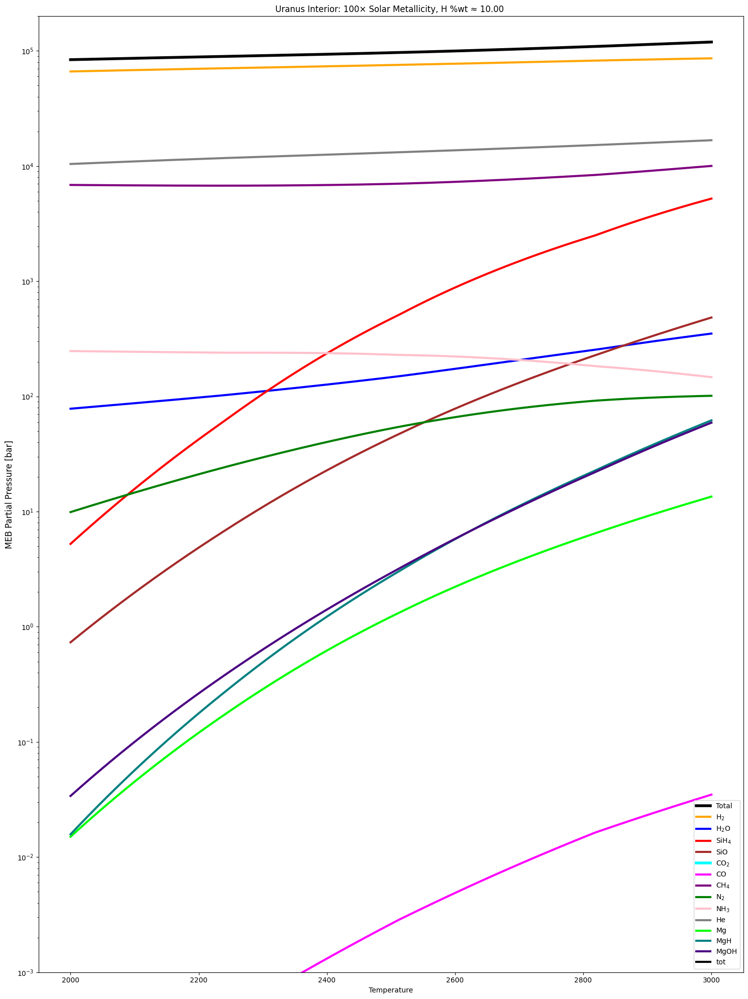

In [11]:
init_metallicity = [1, 3, 10, 30, 100]
for metall in init_metallicity:
    for perc in hmps:
        print(perc)
        h_kgs = perc / 100 * planet_mass  # kg

        si_kg_magma: float = Si_massfraction_palme14 * planet_mass
        mg_kg_magma: float = Mg_massfraction_palme14 * planet_mass
        o_kg_magma: float = O_massfraction_palme14 * planet_mass

        # Lodders et al. (2009) Springer book chapter Table 8
        si_kgs_solar = h_kgs * Si_masspercent_lodders09 / H_masspercent_lodders09
        mg_kgs_solar = h_kgs * Mg_masspercent_lodders09 / H_masspercent_lodders09
        o_kgs_solar = h_kgs * O_masspercent_lodders09 / H_masspercent_lodders09
        c_kgs_solar = h_kgs * C_masspercent_lodders09 / H_masspercent_lodders09
        n_kgs_solar = h_kgs * N_masspercent_lodders09 / H_masspercent_lodders09
        he_kgs_solar = h_kgs * He_masspercent_lodders09 / H_masspercent_lodders09
        mass_constraints = {
            "H": h_kgs,
            "He": he_kgs_solar,
            "C": metall * c_kgs_solar,
            "N": metall * n_kgs_solar,
            "Si": metall * si_kgs_solar + mantle_melt_fraction * si_kg_magma,
            "O": metall * o_kgs_solar + mantle_melt_fraction * o_kg_magma,
            "Mg": metall * mg_kgs_solar + mantle_melt_fraction * mg_kg_magma,
                }

        Uranus = Planet(
            surface_temperature=temperature,
            planet_mass=planet_mass,
            mantle_melt_fraction=mantle_melt_fraction,
            surface_radius=surface_radius,
            )

        model_magma_nosol_ideal = InteriorAtmosphere(species_HHeCNOSi_magma_nosol_ideal)
        model_magma_nosol_ideal.solve(
                planet=Uranus,
                mass_constraints=mass_constraints,
                )
        output_magma_nosol_ideal = model_magma_nosol_ideal.output
        output_magma_nosol_ideal.quick_look()
        output_magma_nosol_ideal.to_excel("HHeCNOSi_magma_nosol_ideal")

        model_magma_sol_ideal = InteriorAtmosphere(species_HHeCNOSi_magma_sol_ideal)
        initial_log_number_density = output_magma_nosol_ideal.log_number_density
        model_magma_sol_ideal.solve(
                planet=Uranus,
                mass_constraints=mass_constraints,
                initial_log_number_density=initial_log_number_density,
                )
        output_magma_sol_ideal = model_magma_sol_ideal.output
        output_magma_sol_ideal.quick_look()
        output_magma_sol_ideal.to_excel("HHeCNOSi_magma_sol_ideal")

        model_magma_sol_real = InteriorAtmosphere(species_HHeCNOSi_magma_sol_real)
        initial_log_number_density = output_magma_sol_ideal.log_number_density
        model_magma_sol_real.solve(
                planet=Uranus,
                mass_constraints=mass_constraints,
                initial_log_number_density=initial_log_number_density,
                )
        output_magma_sol_real = model_magma_sol_real.output
        output_magma_sol_real.quick_look()
        output_magma_sol_real.to_excel("HHeCNOSi_magma_sol_real")

        filename = "HHeCNOSi_magma_sol_real.xlsx"
        
        H2_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="H2_g")["pressure"]
        H2O_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="H2O_g")["pressure"]
        O2_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="O2_g")["pressure"]
        SiH4_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="H4Si_g")["pressure"]
        SiO_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="OSi_g")["pressure"]
        CO2_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="CO2_g")["pressure"]
        CO_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="CO_g")["pressure"]
        CH4_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="CH4_g")["pressure"]
        N2_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="N2_g")["pressure"]
        NH3_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="H3N_g")["pressure"]
        He_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="He_g")["pressure"]
        Mg_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="Mg_g")["pressure"]
        MgOH_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="HMgO_g")["pressure"]
        MgH_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="HMg_g")["pressure"]
        tot_pressure_magma_sol_real = pd.read_excel(filename, sheet_name="atmosphere")["pressure"]

        fig, axes = plt.subplots(1, 1, figsize=(15, 20))

        axes.plot(temperature, tot_pressure_magma_sol_real, color=color_tot, lw=4, ls="-", label="Total")
        axes.plot(temperature, H2_pressure_magma_sol_real, color=color_H2, lw=3, ls="-", label="H$_2$")
        axes.plot(temperature, H2O_pressure_magma_sol_real, color=color_H2O, lw=3, ls="-", label="H$_2$O")
        axes.plot(temperature, SiH4_pressure_magma_sol_real, color=color_SiH4, lw=3, ls="-", label="SiH$_4$")
        axes.plot(temperature, SiO_pressure_magma_sol_real, color=color_SiO, lw=3, ls="-", label="SiO")
        axes.plot(temperature, CO2_pressure_magma_sol_real, color=color_CO2, lw=4, ls="-", label="CO$_2$")
        axes.plot(temperature, CO_pressure_magma_sol_real, color=color_CO, lw=3, ls="-", label="CO")
        axes.plot(temperature, CH4_pressure_magma_sol_real, color=color_CH4, lw=3, ls="-", label="CH$_4$")
        axes.plot(temperature, N2_pressure_magma_sol_real, color=color_N2, lw=3, ls="-", label="N$_2$")
        axes.plot(temperature, NH3_pressure_magma_sol_real, color=color_NH3, lw=3, ls="-", label="NH$_3$")
        axes.plot(temperature, He_pressure_magma_sol_real, color=color_He, lw=3, ls="-", label="He")
        axes.plot(temperature, Mg_pressure_magma_sol_real, color=color_Mg, lw=3, ls="-", label="Mg")
        axes.plot(temperature, MgH_pressure_magma_sol_real, color=color_MgH, lw=3, ls="-", label="MgH")
        axes.plot(temperature, MgOH_pressure_magma_sol_real, color=color_MgOH, lw=3, ls="-", label="MgOH")
        axes.plot(temperature, tot_pressure_magma_sol_real, color=color_tot, lw=3, ls="-", label="tot")

        axes.set_title(r"(a) Real gas")
        axes.set_ylim([1e-3, 2e5])
        axes.set_yscale("log")
        axes.set_xlabel(r"Temperature", fontsize=10)
        axes.set_ylabel(r"MEB Partial Pressure [bar]", fontsize=12)
        axes.get_xaxis().set_major_formatter(ScalarFormatter())

        axes.legend(fontsize=10, loc='best') 
        
        plt.tight_layout()
        title = f"Uranus Interior: {metall:.0f}× Solar Metallicity, H %wt ≈ {perc:.2f} "
        filename = f"./images_pressures/uranus_{metall:.0f}xperc_{perc:.2f}.png"

        plt.title(title)
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()
    